In [1]:
import torch
from torch.nn import functional as F
import pickle
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import time
from nan_ops import NaNPool2d, NaNUnpool2d
import nibabel as nib
from typing import Tuple
import numpy as np
import re
import os
import json
import pandas as pd
from compute_similarity import load_and_conform_image, PSNR #getvol
# from pytorch_msssim import ssim, ms_ssim
from skimage.metrics import structural_similarity as ssim
from scipy.ndimage import gaussian_filter, binary_dilation
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
from ssim import ssim as fondue_ssim
from FastSurferCNN.data_loader.data_utils import get_labels_from_lut, unify_lateralized_labels, read_classes_from_lut, map_aparc_aseg2label


/home/ine5/projects/rrg-glatard/ine5/venv/lib/python3.10/site-packages/torch/cuda/__init__.py:619: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")


## FONDUE

### Embeddings

In [11]:
thresh05_sub = [count_skipped_ops(f"/scratch/vinuyans/skips/slurm/", 0.5, i, ['0025011', ]) for i in range(60,71) ]
sub_ratio = {}
sub_ratio.update(aggregate_per_threshold('0.5', thresh05_sub))


In [18]:
for i in sub_ratio['0.5']['axial']:
    print(i)
    print(sub_ratio['0.5']['axial'][i].mean())

0
0.2476393976048958
1
0.2469957734051345
2
0.24616197836111745
3
0.24555604924600596
4
0.24520819191369217
5
0.24508016632277424
6
0.24476897919759688
7
0.24496830778217257
8
0.24527876717703684
9
0.24565253910914647
10
0.2464254167344835


torch.Size([2, 64, 288, 288])


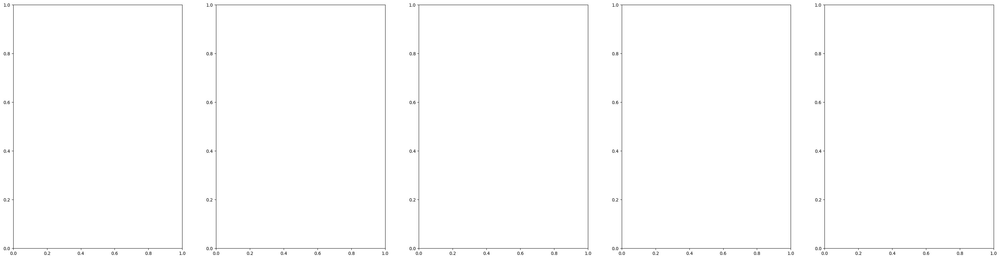

In [20]:
# for layer in ['0_0_base_output', '1_0_bilinear', '2_0_unpool', '1_1_bilinear', '2_0_pool', '3_0_unpool', '2_1_unpool', '1_2_bilinear', '3_0_pool', '4_0_unpool', 
#               '3_1_unpool', '2_2_unpool', '1_3_bilinear', '4_0_pool', '5_0_unpool', '4_1_unpool', '3_2_unpool', '2_3_unpool', '1_4_bilinear', '5_0_pool', '6_0_unpool', 
#               '5_1_unpool', '4_2_unpool', '3_3_unpool', '2_4_unpool', '1_5_bilinear', 'y1', 'y2', 'y3', 'y4', 'y5', 'y6', 'output']:
for layer in ['2_0_unpool', '1_1_bilinear', '3_0_unpool', '2_1_unpool', '1_2_bilinear', '4_0_unpool', '3_1_unpool', '2_2_unpool', '1_3_bilinear', '5_0_unpool', '4_1_unpool', 
              '3_2_unpool', '2_3_unpool', '1_4_bilinear', '6_0_unpool', '5_1_unpool', '4_2_unpool', '3_3_unpool', '2_4_unpool', '1_5_bilinear', 
              'y1', 'y2', 'y3', 'y4', 'y5', 'y6', 'output']:
    embed1 = pickle.load(open(f"/scratch/vinuyans/skips/embeddings/unpool_05/axial_{layer}_60.pkl", 'rb'))
    embed2 = pickle.load(open(f"/scratch/vinuyans/skips/embeddings/unpool_05/axial_{layer}_62.pkl", 'rb'))
    embed3 = pickle.load(open(f"/scratch/vinuyans/skips/embeddings/unpool_05/axial_{layer}_64.pkl", 'rb'))
    embed4 = pickle.load(open(f"/scratch/vinuyans/skips/embeddings/unpool_05/axial_{layer}_66.pkl", 'rb'))
    embed5 = pickle.load(open(f"/scratch/vinuyans/skips/embeddings/unpool_05/axial_{layer}_68.pkl", 'rb'))

    fig, axes = plt.subplots(1,5, figsize=(40, 10))

    print(embed1.shape)
    break
    if layer in ['y1', 'y2', 'y3', 'y4', 'y5', 'y6', 'output']: i=0
    else: i=10
    gc = sns.heatmap(embed1[0,i], cmap='viridis', ax=axes[0])
    gc.set_title(f"{layer}")
    gc = sns.heatmap(embed2[0,i], cmap='viridis', ax=axes[1])
    gc.set_title(f"{layer}")
    gc = sns.heatmap(embed3[0,i], cmap='viridis', ax=axes[2])
    gc.set_title(f"{layer}")
    gc = sns.heatmap(embed4[0,i], cmap='viridis', ax=axes[3])
    gc.set_title(f"{layer}")
    gc = sns.heatmap(embed5[0,i], cmap='viridis', ax=axes[4])
    gc.set_title(f"{layer}")



### Skip Count

In [16]:
def count_skipped_ops(filename, thresh, slice, subjects):

    sub_count = []
    for subject in subjects:
        # "/scratch/vinuyans/skips/slurm/t1.0_sub-0003002_{i}.out"

        # f = open(f"{filename}/t{thresh}_sub-{subject}_{slice}.out", 'r')
        f = open(f"{filename}/unpool_{thresh}_sub-{subject}_{slice}.out", 'r')
    #     print(filename)

        skip_count = {}

        for line in f: 
            
            line = line.strip()
            if 'model loaded' in line:
                if line.split('model loaded')[0].strip() == 'First':
                        axis = 'axial'
                        skip_count[axis] = {}
                elif line.split('model loaded')[0].strip() == 'Second':
                    axis = 'coronal'
                    skip_count[axis] = {}
                elif line.split('model loaded')[0].strip() == 'Third':
                    axis = 'sagittal'
                    skip_count[axis] = {}    
            # views = {'First': 'axial', 'Second': 'coronal', 'Third': 'sagittal'}
            
            # Regex pattern
            pattern = r'(?:\d{1,2} \w{3}  \d{1,2} \d{2}:\d{2}:\d{2} \d{4}, )?(\d+_\d+): Conv1: (\d+)/(\d+), Conv2: (\d+)/(\d+), Conv3: (\d+)/(\d+)'
            pattern2 = r'(?:\d{1,2} \w{3}  \d{1,2} \d{2}:\d{2}:\d{2} \d{4}, )?(\d+_\d+): Conv1: (\d+)/(\d+), Conv2: (\d+)/(\d+)'
            
            match = re.search(pattern, line)
            match_0_0 = re.search(pattern2, line)
            if match_0_0 and match_0_0.group(1) == '0_0':
                key = match_0_0.group(1)
                # if key == '6_0': print('here')
                skip_count[axis][key] = {
                    'Conv1': int(match_0_0.group(2))/int(match_0_0.group(3)),
                    'Conv2': int(match_0_0.group(4))/int(match_0_0.group(5)),
                }
            elif match:
                key = match.group(1)
                # if key == '6_0': print('here')
                skip_count[axis][key] = {
                    'Conv1': int(match.group(2))/int(match.group(3)),
                    'Conv2': int(match.group(4))/int(match.group(5)),
                    'Conv3': int(match.group(6))/int(match.group(7))
                }
        
        sub_count.append( skip_count )
     
    return sub_count


block_order = ['0_0', '1_0', '2_0', '3_0', '4_0', '5_0', '6_0',
               '0_1', '1_1', '2_1', '3_1', '4_1', '5_1',
               '0_2', '1_2', '2_2', '3_2', '4_2',
               '0_3', '1_3', '2_3', '3_3',
               '0_4', '1_4', '2_4',
               '0_5', '1_5',
               '0_6']


# block_order = ['0_0',
#                '0_1', '1_0',
#                '0_2', '1_1', '2_0',
#                '0_3', '1_2', '2_1', '3_0',
#                '0_4', '1_3', '2_2', '3_1', '4_0',
#                '0_5', '1_4', '2_3', '3_2', '4_1', '5_0',
#                '0_6', '1_5', '2_4', '3_3', '4_2', '5_1', '6_0']


def aggregate_per_threshold(thresh, thresh_sub):

    sub_ratio = {thresh: {'coronal': {}, 'axial': {}, 'sagittal': {}} }

    for num, slice in enumerate(thresh_sub):
        # Each `slice` represents a list of subjects for the current `num` (block)

        for subject_idx, subject in enumerate(slice):

            for plane in subject:
                if num not in sub_ratio[thresh][plane]:
                    # Initialize as a 2D list, where each row represents a subject
                    sub_ratio[thresh][plane][num] = []

                subject_values = []
                for block in block_order:
                    # Append the mean value for the current subject and plane
                    subject_values.append(np.mean(list(subject[plane][block].values())))

                # Now add these subject values as a new row (horizontally)
                sub_ratio[thresh][plane][num].append(subject_values)

        # Convert list to numpy array for consistent (subjects, blocks) shape
        for plane in sub_ratio[thresh]:
            for num in sub_ratio[thresh][plane]:
                sub_ratio[thresh][plane][num] = np.array(sub_ratio[thresh][plane][num])

    return sub_ratio



Coronal Plane Threshold 1 Skipped Operations: 0.00 %
Coronal Plane Threshold 0.8 Skipped Operations: 26.88 %
Coronal Plane Threshold 0.5 Skipped Operations: 33.97 %
Coronal Plane Threshold 0.4 Skipped Operations: 33.73 %
Axial Plane Threshold 1 Skipped Operations: 0.00 %
Axial Plane Threshold 0.8 Skipped Operations: 26.89 %
Axial Plane Threshold 0.5 Skipped Operations: 34.01 %
Axial Plane Threshold 0.4 Skipped Operations: 33.90 %
Sagittal Plane Threshold 1 Skipped Operations: 0.00 %
Sagittal Plane Threshold 0.8 Skipped Operations: 26.78 %
Sagittal Plane Threshold 0.5 Skipped Operations: 33.92 %
Sagittal Plane Threshold 0.4 Skipped Operations: 33.70 %


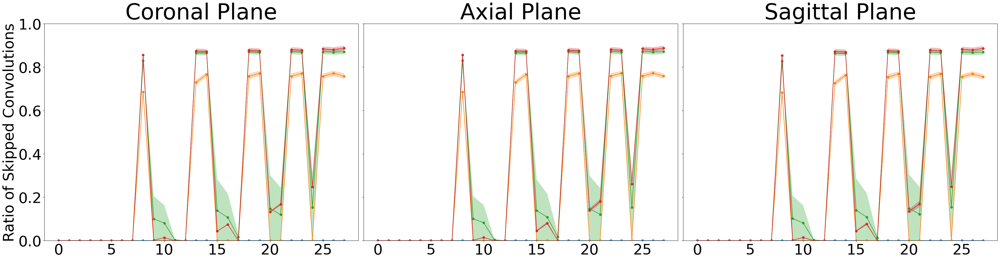

In [17]:
# thresh01_sub = [count_skipped_ops(f"/scratch/vinuyans/skips/slurm/", 0.1, i, ['0025011', ]) for i in range(128) ]
# thresh02_sub = [count_skipped_ops(f"/scratch/vinuyans/skips/slurm/", 0.2, i, ['0025011', ]) for i in range(128) ]
thresh04_sub = [count_skipped_ops(f"/scratch/vinuyans/skips/slurm/", 0.4, i, ['0025011', '0003002', '0025248', '0025350', '0025531' ]) for i in range(128) ]
thresh05_sub = [count_skipped_ops(f"/scratch/vinuyans/skips/slurm/", 0.5, i, ['0025011', '0003002', '0025248', '0025350', '0025531' ]) for i in range(128) ]  
# thresh075_sub = [count_skipped_ops(f"/scratch/vinuyans/skips/slurm/", 0.75, i, ['0025011', '0003002', '0025248', '0025350', '0025531' ]) for i in range(128) ]
thresh08_sub = [count_skipped_ops(f"/scratch/vinuyans/skips/slurm/", 0.8, i, ['0025011', '0003002', '0025248', '0025350', '0025531' ]) for i in range(128) ]
thresh1_sub = [count_skipped_ops(f"/scratch/vinuyans/skips/slurm/", 1.0, i, ['0025011', '0003002', '0025248', '0025350', '0025531' ]) for i in range(128) ]

sub_ratio={}


sub_ratio.update(aggregate_per_threshold('1', thresh1_sub))
sub_ratio.update(aggregate_per_threshold('0.8', thresh08_sub))
# sub_ratio.update(aggregate_per_threshold('0.75', thresh075_sub))
sub_ratio.update(aggregate_per_threshold('0.5', thresh05_sub))
sub_ratio.update(aggregate_per_threshold('0.4', thresh04_sub))
# sub_ratio.update(aggregate_per_threshold('0.2', thresh02_sub))
# sub_ratio.update(aggregate_per_threshold('0.1', thresh01_sub))


fig, axes = plt.subplots(1, 3, figsize=(38,10), sharey=True)

for num, plane in enumerate(['coronal', 'axial', 'sagittal']):
# for num, plane in enumerate(['coronal', 'sagittal']):

    # for thresh in ['1', '0.75', '0.5', '0.4' ]:
    for thresh in ['1', '0.8', '0.5', '0.4' ]:

        subs = np.array(list(sub_ratio[thresh][plane].values()))
        # print(subs.shape)

        # avg = np.mean( np.array(list(sub_ratio[thresh][plane].values())), axis=(0,1)).squeeze()
        # stdev = np.std( np.array(list(sub_ratio[thresh][plane].values())), axis=(0,1)).squeeze()
        avg = subs.mean(0).mean(0)
        stdev = subs.mean(0).std(0)

        axes[num].plot(avg, label=f'Threshold {thresh}', marker='o')
        axes[num].fill_between(range(len(avg)), avg - stdev, avg + stdev, alpha=0.3)
        axes[num].set_ylim(0.,1)
        print(f'{plane.title()} Plane Threshold {thresh} Skipped Operations: {np.mean( np.array(list(sub_ratio[thresh][plane].values())) )*100:.2f} %')
        # axes[num].set_xticks(np.arange(len(avg)), np.arange(1,len(avg)+1), fontsize=30)
        axes[num].tick_params(axis='both', labelsize=40)
        axes[num].set_title(f"{plane.title()} Plane", fontsize=60)
        # axes[num].set_xlabel('Model Layers', fontsize=50)
axes[0].set_ylabel('Ratio of Skipped Convolutions', fontsize=40)
# handles, labels = axes[0].get_legend_handles_labels()
# fig.legend(handles, labels, prop={'size': 50}, loc='lower center', bbox_to_anchor=(0.5, -0.2), ncol=5)

# plt.suptitle(f"Average Skipped Operations: {np.array([list(sub_ratio['0.5'][plane].values()) for plane in sub_ratio['0.5'].keys()]).mean()*100:.2f} %", fontsize=25)
plt.tight_layout()
plt.savefig('/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/figures/fondue_nanunpool_per_architecture.pdf', format="pdf", bbox_inches="tight")

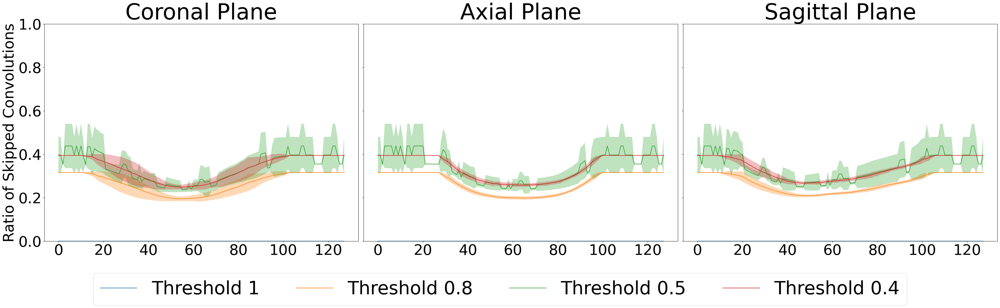

In [18]:
fig, axes = plt.subplots(1, 3, figsize=(38,10), sharey=True)

for num, plane in enumerate(['coronal', 'axial', 'sagittal']):

    # for thresh in ['1', '0.75', '0.5', '0.4'  ]:
    for thresh in ['1', '0.8', '0.5', '0.4'  ]:

        subs = np.array(list(sub_ratio[thresh][plane].values()))
        # print(subs.mean(2).shape)

        # avg = np.mean( np.array(list(sub_ratio[thresh][plane].values())), axis=(1,2))
        # stdev = np.std( np.array(list(sub_ratio[thresh][plane].values())), axis=(1,2))
        avg = subs.mean(2).mean(1)
        stdev = subs.mean(2).std(1)

        axes[num].plot(avg, label=f'Threshold {thresh}')
        axes[num].fill_between(range(len(avg)), avg - stdev, avg + stdev, alpha=0.3)
        axes[num].set_ylim(0.,1)
        axes[num].tick_params(axis='both', labelsize=40)
        axes[num].set_title(f"{plane.title()} Plane", fontsize=60)
        # axes[num].set_xlabel('Brain Slices', fontsize=40)
axes[0].set_ylabel('Ratio of Skipped Convolutions', fontsize=40)
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, prop={'size': 50}, loc='lower center', bbox_to_anchor=(0.5, -0.2), ncol=5)


plt.tight_layout()
plt.savefig('/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/figures/fondue_nanunpool_per_slice.pdf', format="pdf", bbox_inches="tight")


In [ ]:
for thresh in ['1', '0.75', '0.5', '0.4' ]:
    avg = []
    avg_trim = []
    for num, plane in enumerate(['axial', 'coronal', 'sagittal']):

        subs = np.array(list(sub_ratio[thresh][plane].values()))
        # print(subs.shape)
        avg.append( subs.mean() ) 
        avg_trim.append( subs[subs != 0.].mean() ) 

        # print(f'{plane.title()} Plane Threshold {thresh} Skipped Operations: {np.mean( subs )*100:.2f} %')

    print(f'General Threshold {thresh} Skipped Operations: {np.mean( avg )*100:.2f} %')
    print(f'Decoder Threshold {thresh} Skipped Operations: {np.mean( avg_trim )*100:.2f} %')


General Threshold 1 Skipped Operations: 0.00 %
Decoder Threshold 1 Skipped Operations: nan %
General Threshold 0.75 Skipped Operations: 27.64 %
Decoder Threshold 0.75 Skipped Operations: 77.39 %
General Threshold 0.5 Skipped Operations: 33.97 %
Decoder Threshold 0.5 Skipped Operations: 82.53 %
General Threshold 0.4 Skipped Operations: 33.77 %
Decoder Threshold 0.4 Skipped Operations: 55.67 %


/tmp/ipykernel_3973612/1871224075.py:9: RuntimeWarning: Mean of empty slice.
  avg_trim.append( subs[subs != 0.].mean() )
/home/ine5/projects/rrg-glatard/ine5/venv/lib/python3.10/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


### PSNR

In [19]:
class PSNR:
    """Peak Signal to Noise Ratio
    img1 and img2 have range [0, 255]"""

    def __init__(self):
        self.name = "PSNR"

    @staticmethod
    def __call__(img1, img2, device):
        mse = torch.nn.MSELoss()
        a = img1.to(device, dtype = torch.float32)
        b = img2.to(device, dtype = torch.float32)
        mse_total = mse(a,b)
        psnr = 20 * torch.log10(1.0 / torch.sqrt(mse_total))
        return psnr
    
# Modified MSE function for masked arrays
def mse(original, reconstructed):
    masked_diff = np.ma.masked_array((original - reconstructed) ** 2)
    return masked_diff.mean()  # Calculate mean of masked array elements

class PSNR2:
    """Peak Signal to Noise Ratio
    img1 and img2 have range [0, 255]"""

    def __init__(self):
        self.name = "PSNR"

    @staticmethod
    def __call__(img1, img2, device):
        # mse = torch.nn.MSELoss()
        # a = img1.to(device, dtype = torch.float32)
        # b = img2.to(device, dtype = torch.float32)
        # print(img1.compressed.shape, img2.compressed.shape)
        mse_total = mse(img1,img2)
        psnr = 20 * np.log10(1.0 / np.ma.sqrt(mse_total))
        return psnr
    
def min_max_normalize(masked_array):
    # Calculate the min and max of the unmasked elements
    min_val = masked_array.min()
    max_val = masked_array.max()

    # Apply min-max normalization only to unmasked elements
    normalized_array = (masked_array - min_val) / (max_val - min_val)
    
    return normalized_array

def calculate_psnr(img1, img2):
    # Ensure the images have the same shape
    assert img1.shape == img2.shape, "Input images must have the same dimensions"
    
    # Calculate MSE
    mse = np.mean((img1 - img2) ** 2)
    
    # Avoid division by zero
    if mse == 0:
        return float('inf'), None  # Identical images would have infinite PSNR

    # Calculate the maximum intensity of the original image
    max_intensity = np.max(img1)
    print(max_intensity)

    # Calculate PSNR
    psnr = 10 * np.log10((max_intensity ** 2) / mse)
    return psnr

def normalize(slice):
    min_val = slice.min()
    max_val = slice.max()

    # Check if max equals min to avoid division by zero
    if max_val != min_val:
        slice = (slice - min_val) / (max_val - min_val)
    else:
        # All values are the same, assign a constant value, e.g., 0
        slice = torch.zeros_like(slice)

    return slice

def getvol(path_denoised):
    img_denoised = load_and_conform_image(path_denoised) #Read the image
    img_denoised = np.nan_to_num(img_denoised)
    # print(img_denoised.min(), img_denoised.max())
    img_denoised = 255.0*(img_denoised - img_denoised.min()) / \
        (img_denoised.max() - img_denoised.min())
    img_denoised = img_denoised.astype(np.single)
    return img_denoised

def smooth_and_binarize_mask(volume, sigma=1.0, threshold=0.1, dilation_iterations=1):
    """
    Smooth a 3D array, threshold non-zero values, and binarize the result.

    Parameters:
    - volume: 3D NumPy array to process
    - sigma: float, standard deviation for Gaussian kernel (default=1.0)
    - threshold: float, threshold value for binarization (default=0.1)
    
    Returns:
    - binary_mask: 3D binary mask as a NumPy array
    """

    # Step 1: Apply Gaussian smoothing to the input volume
    smoothed_volume = gaussian_filter(volume, sigma=sigma)
    
    # Step 2: Threshold values that are not zero
    thresholded_volume = np.where(smoothed_volume > threshold, 1, 0)
    
    # Step 3: Return the binary mask
    binary_mask = (thresholded_volume > 0).astype(np.uint8)
    
    # Step 4: Apply binary dilation to close any holes
    dilated_mask = binary_dilation(binary_mask, iterations=dilation_iterations).astype(np.uint8)
    
    return dilated_mask


def peak_snr_across_slices_unmerged(filedir):

    fig, axes = plt.subplots(1, 3, figsize=(25,5), sharey=True)
    psnr = PSNR()



    for num, plane in enumerate(['coronal', 'axial', 'sagittal']):
        
        for thresh in ['1', '05', '075']:
            snr_slices = []

            for i in range(128):

                ieee_slice = pickle.load(open(f"{filedir}/ieee/{plane}/processed/{i}_slice.pkl", "rb")) #.squeeze()[0].numpy()               
                thresh_slice = pickle.load(open(f"{filedir}/thresh{thresh}/{plane}/processed/{i}_slice.pkl", "rb")) #.squeeze()[0].numpy()                  
                    
                #Create MASK FROM IEEE

                # snr_slices.append(calculate_psnr(ieee_slice, thresh_slice))
                snr_slices.append(psnr(ieee_slice, thresh_slice, 'cpu'))

            if thresh == 'ieee': 
                axes[num].plot(snr_slices, label=f'Default')            
            else:
                axes[num].plot(snr_slices, label=f'Threshold {thresh}')
        axes[num].legend()
        axes[num].set_title(plane.title())
    axes[0].set_ylabel('PSNR (dB)')
    plt.tight_layout()


def peak_snr_across_slices_aggregated(filedir, thresholds, subjects, unpool=""):
    
    fig, axes = plt.subplots(1, 3, figsize=(25,5), sharey=True)
    psnr = PSNR2()
    snr = {}

    for num, plane in enumerate(['coronal', 'axial', 'sagittal']):
    # for num, plane in enumerate(['coronal', 'sagittal']):
        snr[plane] = {}

        for thresh in thresholds:
            snr_slices_per_subject = []

            for subject in subjects:
                subject_snr_slices = []
                # subject_dir = f'{filedir}/{subject}'
                mask = smooth_and_binarize_mask(nib.load(f'{filedir}/sub-{subject}/groundtruth.nii').get_fdata(), sigma=0.5, threshold=0.)

                ieee_img = getvol(f'{filedir}/sub-{subject}/groundtruth.nii')
                if thresh == 'ieee':
                    thresh_img = getvol(f'{filedir}/sub-{subject}/ieee/sub-{subject}_ieee_aggr.nii.gz')
                    # thresh_img = getvol(f'{filedir}/sub-{subject}/thresh05_debug/sub-{subject}_ieee_aggr{raw}.nii.gz')
                else:
                    # if unpool == "" and subject in ['0025011', '0025248'] and thresh == '05':
                    #     thresh_img = getvol(f'{filedir}/sub-{subject}/thresh{thresh}_cp/sub-{subject}_thresh{thresh}_aggr.nii.gz')
                    # else:
                    thresh_img = getvol(f'{filedir}/sub-{subject}/{unpool}/thresh{thresh}/sub-{subject}_thresh{thresh}_aggr.nii.gz')

                for i in range(256):
                    if plane == 'axial':
                        ieee_slice = ieee_img[i]
                        thresh_slice = thresh_img[i]
                        mask_slice = mask[i]
                    elif plane == 'sagittal':
                        ieee_slice = ieee_img[:, :, i]
                        thresh_slice = thresh_img[:, :, i]
                        mask_slice = mask[:, :, i]
                    else:
                        ieee_slice = ieee_img[:, i, :]
                        thresh_slice = thresh_img[:, i, :]
                        mask_slice = mask[:, i, :]

                    # ieee_slice = torch.from_numpy(ieee_slice).to('cpu').type(torch.float16) 
                    # thresh_slice = torch.from_numpy(thresh_slice).to('cpu').type(torch.float16) 

                    # ieee_slice = (ieee_slice - ieee_slice.min()) / (ieee_slice.max() - ieee_slice.min())
                    # thresh_slice = (thresh_slice - thresh_slice.min()) / (thresh_slice.max() - thresh_slice.min())

                    ieee_slice = np.ma.masked_array(ieee_slice, mask=~mask_slice.astype(bool))
                    thresh_slice = np.ma.masked_array(thresh_slice, mask=~mask_slice.astype(bool))

                    ieee_slice = min_max_normalize(ieee_slice )
                    thresh_slice = min_max_normalize(thresh_slice )


                    output = psnr(ieee_slice, thresh_slice, 'cpu').item()
                    # output = psnr(ieee_slice[mask_slice != False], thresh_slice[mask_slice != False], 'cpu').item()
                    subject_snr_slices.append(output)


                snr_slices_per_subject.append(subject_snr_slices)

            # Aggregate SNR per threshold across subjects
            snr[plane][thresh] = snr_slices_per_subject

            # Plotting (assuming averaging across subjects for plotting)
            # avg_snr_slices = np.mean(snr_slices_per_subject, axis=0)
            avg = np.mean( np.array(snr[plane][thresh]), axis=(0))
            stdev = np.std( np.array(snr[plane][thresh]), axis=(0))

            label = 'Default' if thresh == 'ieee' else f'Threshold {thresh}'
            axes[num].plot(avg, label=label)
            axes[num].fill_between(range(len(avg)), avg - stdev, avg + stdev, alpha=0.3)  

            axes[num].set_xlim(1, 256)
            axes[num].set_xlabel('Brain Slices', fontsize=15)

        
        axes[num].legend(fontsize=15, loc='lower center')
        axes[num].set_title(f"{plane.title()} Plane", fontsize=20)
    axes[0].set_ylabel('PSNR (dB)', fontsize=15)
    plt.tight_layout()

    return snr


**Testing Thresholds Below 0.4**

/tmp/ipykernel_613741/3086470198.py:36: RuntimeWarning: divide by zero encountered in log10
  psnr = 20 * np.log10(1.0 / np.ma.sqrt(mse_total))


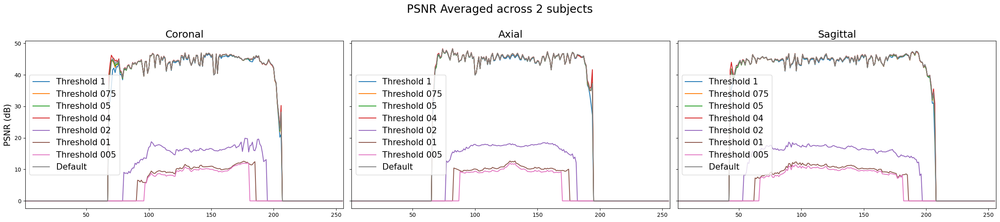

In [84]:
snr_mask = peak_snr_across_slices_aggregated("/scratch/vinuyans/skips", thresholds=['1', '09', '075', '05', '04', '02', '01', '005', 'ieee'], subjects=['0025011'], unpool="unpool" ) #'0025248', '0025350', '0025531'
# snr_mask = peak_snr_across_slices_aggregated("/scratch/vinuyans/skips", thresholds=['05',  'ieee'], subjects=['0025011'], raw="" ) #'0025248', '0025350', '0025531'
plt.suptitle('PSNR Averaged across 2 subjects', fontsize=20, y=1.1);

In [ ]:
snr_mask = peak_snr_across_slices_aggregated("/scratch/vinuyans/skips", thresholds=['1', '08', '05', '04', 'ieee'], subjects=['0025011', '0003002', '0025248', '0025350', '0025531'], unpool="unpool" ) #'0025248', '0025350', '0025531'
plt.savefig('/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/figures/fondue_nanunpool_psnr.pdf', format="pdf", bbox_inches="tight")
# plt.suptitle('PSNR Averaged across 5 subjects', fontsize=20, y=1.1);
pickle.dump(snr_mask, open('/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/fondue_nanunpool_psnr.pkl', 'wb'))

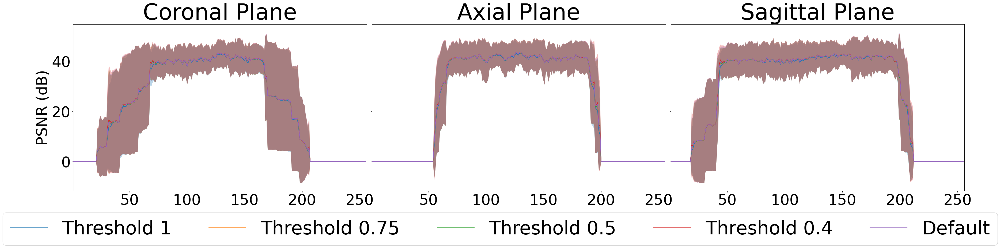

In [20]:
snr_mask = pickle.load(open('/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/fondue_nanunpool_psnr.pkl', 'rb'))

fig, axes = plt.subplots(1, 3, figsize=(35,8), sharey=True)

for num, plane in enumerate(['coronal', 'axial', 'sagittal']):

    for thresh in ['1', '075', '05', '04', 'ieee']:
        avg = np.mean( np.array(snr_mask[plane][thresh]), axis=(0))
        stdev = np.std( np.array(snr_mask[plane][thresh]), axis=(0))

        if '0' in thresh:
            thresh_name = f"0.{thresh.split('0')[-1]}"
        else: thresh_name = thresh
        label = 'Default' if thresh == 'ieee' else f'Threshold {thresh_name}'
        axes[num].plot(avg, label=label)
        axes[num].fill_between(range(len(avg)), avg - stdev, avg + stdev, alpha=0.3)  

        axes[num].set_xlim(1, 256)
        # axes[num].set_xlabel('Brain Slices', fontsize=40)

        axes[num].tick_params(axis='both', labelsize=40)

    # axes[num].legend(fontsize=15, loc='lower center')
        axes[num].set_title(f"{plane.title()} Plane", fontsize=60)
axes[0].set_ylabel('PSNR (dB)', fontsize=40)
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, prop={'size': 50}, loc='lower center', bbox_to_anchor=(0.5, -0.2), ncol=5)


plt.tight_layout()
plt.savefig('/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/figures/fondue_nanunpool_psnr.pdf', format="pdf", bbox_inches="tight")


**NaN Pooling Reference**

In [15]:
snr_mask = peak_snr_across_slices_aggregated("/scratch/vinuyans/skips", thresholds=['1', '075', '05', '04', 'ieee'], subjects=['0025011', '0003002', '0025248', '0025350', '0025531'], unpool="" ) #'0025248', '0025350', '0025531'
plt.savefig('/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/figures/fondue_nanpool_psnr.pdf', format="pdf", bbox_inches="tight")
# plt.suptitle('NaN Pooling PSNR Averaged across 5 subjects', fontsize=20, y=1.1);
pickle.dump(snr_mask, open('/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/fondue_nanpool_psnr.pkl', 'wb'))

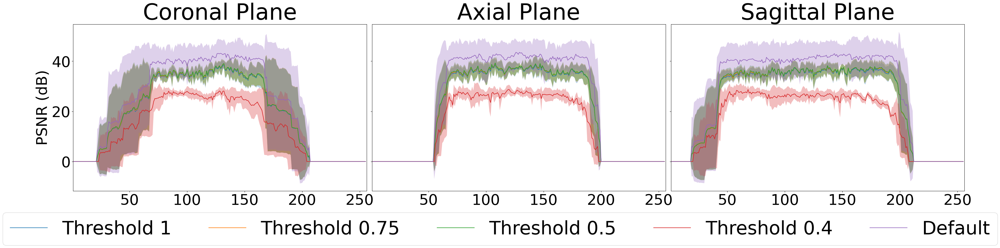

In [21]:
snr_mask = pickle.load(open('/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/fondue_nanpool_psnr.pkl', 'rb'))

fig, axes = plt.subplots(1, 3, figsize=(35,8), sharey=True)

for num, plane in enumerate(['coronal', 'axial', 'sagittal']):

    for thresh in ['1', '075', '05', '04', 'ieee']:
        avg = np.mean( np.array(snr_mask[plane][thresh]), axis=(0))
        stdev = np.std( np.array(snr_mask[plane][thresh]), axis=(0))

        if '0' in thresh:
            thresh_name = f"0.{thresh.split('0')[-1]}"
        else: thresh_name = thresh
        label = 'Default' if thresh == 'ieee' else f'Threshold {thresh_name}'
        axes[num].plot(avg, label=label)
        axes[num].fill_between(range(len(avg)), avg - stdev, avg + stdev, alpha=0.3)  

        axes[num].set_xlim(1, 256)
        # axes[num].set_xlabel('Brain Slices', fontsize=40)

        axes[num].tick_params(axis='both', labelsize=40)

    # axes[num].legend(fontsize=15, loc='lower center')
        axes[num].set_title(f"{plane.title()} Plane", fontsize=60)
axes[0].set_ylabel('PSNR (dB)', fontsize=40)
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, prop={'size': 50}, loc='lower center', bbox_to_anchor=(0.5, -0.2), ncol=5)


plt.tight_layout()
plt.savefig('/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/figures/fondue_nanpool_psnr.pdf', format="pdf", bbox_inches="tight")


### SSIM

In [22]:
os.chdir('/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project')

def ssim_across_slices_scipy(filedir, thresholds, subjects, share=True, unpool=""):

    fig, axes = plt.subplots(1, 3, figsize=(25,5), sharey=share)

    ssim_dict = {}

    for num, plane in enumerate(['coronal', 'axial', 'sagittal']):
    # for num, plane in enumerate(['coronal']):
        ssim_dict[plane] = {}
        
        for thresh in thresholds:

            ssim_slices_per_subject = []

            for subject in subjects:        
        
                ssim_slices = []
                ssim_dict[plane][thresh] = []

                # mask_template = getvol('/scratch/vinuyans/skips/sub-0003002/sub-0003002_ieee_whole_mask.nii.gz')
                mask = smooth_and_binarize_mask(nib.load(f'{filedir}/sub-{subject}/groundtruth.nii').get_fdata(), sigma=0.5, threshold=0.) 
                # if masked:
                #     ieee_img = getvol('{filedir}/ieee/sub-{subject}/sub-{subject}_ieee_whole_mask.nii.gz')
                #     thresh_img = getvol(f'{filedir}/sub-{subject}/thresh{thresh}/sub-{subject}_thresh{thresh}_aggr_masked.nii.gz')
                # else:
                ieee_img = getvol(f'{filedir}/sub-{subject}/groundtruth.nii')
                if thresh == 'ieee':
                    # thresh_img = getvol(f'/scratch/vinuyans/skips/ieee/sub-0003002/sub-0003002_ieee_whole.nii.gz')
                    thresh_img = getvol(f'{filedir}/sub-{subject}/ieee/sub-{subject}_ieee_aggr.nii.gz')

                else:
                    thresh_img = getvol(f'{filedir}/sub-{subject}/{unpool}/thresh{thresh}/sub-{subject}_thresh{thresh}_aggr.nii.gz')
                    # thresh_img = getvol(f'{filedir}/sub-{subject}/thresh{thresh}/sub-{subject}_thresh{thresh}_aggr.nii.gz')

                #get mask
                # mask = np.where(mask_template == 0, False, True).squeeze()


                for i in range(256):

                    # ieee_slice = pickle.load(open(f"{filedir}/ieee/{plane}/processed/{i}_slice.pkl", "rb")) #.squeeze()[0].numpy()      
                    # thresh_slice = pickle.load(open(f"{filedir}/thresh{thresh}/{plane}/processed/{i}_slice.pkl", "rb")) #.squeeze()[0].numpy()                  
                    if plane == 'axial':
                        ieee_slice = ieee_img[i]
                        thresh_slice = thresh_img[i]
                        mask_slice = mask[i]
                    elif plane == 'sagittal':
                        ieee_slice = ieee_img[:, :, i]
                        thresh_slice = thresh_img[:, :, i]
                        mask_slice = mask[:, :, i]
                    else:
                        ieee_slice = ieee_img[:, i, :]
                        thresh_slice = thresh_img[:, i, :]
                        mask_slice = mask[:, i, :]

                    # ieee_slice = torch.from_numpy(ieee_slice).to('cpu').type(torch.float16) 
                    # thresh_slice = torch.from_numpy(thresh_slice).to('cpu').type(torch.float16) 

                    ieee_slice = (ieee_slice - ieee_slice.min()) / (ieee_slice.max() - ieee_slice.min())
                    thresh_slice = (thresh_slice - thresh_slice.min()) / (thresh_slice.max() - thresh_slice.min())

                    ieee_slice = torch.unsqueeze(torch.tensor(ieee_slice), 0)
                    thresh_slice = torch.unsqueeze(torch.tensor(thresh_slice), 0)

                    ieee_slice = ieee_slice * mask_slice
                    thresh_slice = thresh_slice * mask_slice

                    # ieee_slice = np.ma.masked_array(ieee_slice, mask=~mask_slice.astype(bool))
                    # thresh_slice = np.ma.masked_array(thresh_slice, mask=~mask_slice.astype(bool))

                    # ieee_slice = min_max_normalize(ieee_slice )
                    # thresh_slice = min_max_normalize(thresh_slice )


                    try:
                        ssim_noise = fondue_ssim(torch.unsqueeze(ieee_slice,0),torch.unsqueeze(thresh_slice,0), data_range = 1)
                        # ssim_noise = ssim(ieee_slice, thresh_slice, win_size=11, win_sigma=1.5, data_range=1)
                        # ssim_noise = ssim(ieee_slice[mask_slice != False], thresh_slice[mask_slice != False], data_range=1)
                    except:
                        ssim_noise = float('nan')

                    ssim_slices.append( ssim_noise )
                
                ssim_slices_per_subject.append(ssim_slices)

            ssim_dict[plane][thresh] = ssim_slices_per_subject

            # axes[num].plot(np.nan_to_num(ssim_slices), label=f'Threshold {thresh}')
            avg = np.mean( np.array(ssim_dict[plane][thresh]), axis=(0))
            stdev = np.std( np.array(ssim_dict[plane][thresh]), axis=(0))

            if thresh == 'ieee':
                axes[num].plot(avg, label=f'Default')            
            else:
                axes[num].plot(avg, label=f'Threshold {thresh}')
            axes[num].fill_between(range(len(avg)), avg - stdev, avg + stdev, alpha=0.3)
            # break
        axes[num].set_ylim(0.5, 1.05)
        axes[num].legend()
        # axes[num].set_xlim(1, 256)

        axes[num].set_title(plane.title(), fontsize=18)
        # break
    axes[0].set_ylabel('SSIM', fontsize=15)
    axes[0].set_xlabel('Brain Slices', fontsize=15)
    # axes[0].set_ylim(0, 1.05)
    plt.tight_layout()

    return ssim_dict


**NaN UnPooling**

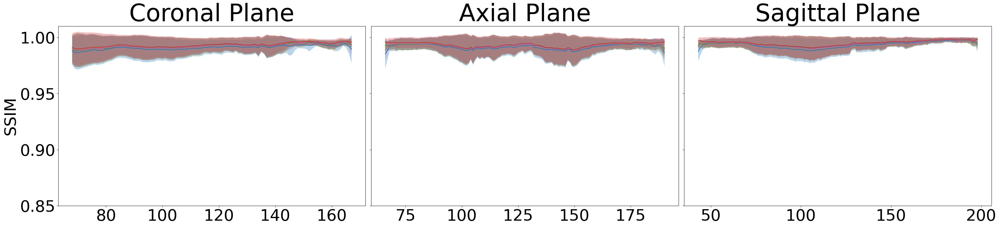

In [110]:
ssim_slices = pickle.load(open('/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/unpool_ssim_5subs.pkl', 'rb'))

fig, axes = plt.subplots(1, 3, figsize=(35,8), sharey=True)

for num, plane in enumerate(['coronal', 'axial', 'sagittal']):
    for thresh in ['1', '08', '05', '04', 'ieee']:
        avg = np.mean( np.array(ssim_slices[plane][thresh]), axis=(0))
        stdev = np.std( np.array(ssim_slices[plane][thresh]), axis=(0))

        if thresh == 'ieee':
            axes[num].plot(avg, label=f'Default')            
        else:
            axes[num].plot(avg, label=f'Threshold {thresh}')
        axes[num].fill_between(range(len(avg)), avg - stdev, avg + stdev, alpha=0.3)

    axes[num].set_ylim(0.85, 1.01)
    # axes[num].set_xlim(50, 200)
    # axes[num].legend(prop={'size': 12})
    # axes[num].set_xlabel('Brain Slices', fontsize=40)

    axes[num].set_title(f"{plane.title()} Plane", fontsize=60)
    axes[num].tick_params(axis='x', labelsize=40)
    axes[num].tick_params(axis='y', labelsize=40)

# handles, labels = axes[0].get_legend_handles_labels()
# fig.legend(handles, labels, prop={'size': 50}, loc='lower center', bbox_to_anchor=(0.5, -0.2), ncol=5)
axes[0].set_ylabel('SSIM', fontsize=40)
plt.tight_layout()
plt.savefig('/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/figures/fondue_nanunpool_ssim.pdf', format="pdf", bbox_inches="tight")


In [92]:
ssim_slices = ssim_across_slices_scipy("/scratch/vinuyans/skips", thresholds=['04', '05', '08', '1', 'ieee'], subjects=['0025011', '0003002', '0025248', '0025350', '0025531'], share=True, unpool='unpool')

pickle.dump(ssim_slices, open('/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/unpool_ssim_5subs.pkl', 'wb'))


**NaN Pooling**

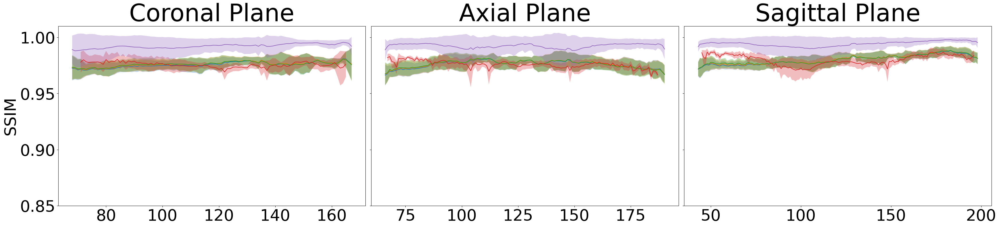

In [112]:
ssim_slices = pickle.load(open('/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/pool_ssim_5subs.pkl', 'rb'))

fig, axes = plt.subplots(1, 3, figsize=(35,8), sharey=True)

for num, plane in enumerate(['coronal', 'axial', 'sagittal']):
    for thresh in ['1', '075', '05', '04', 'ieee']:
        avg = np.mean( np.array(ssim_slices[plane][thresh]), axis=(0))
        stdev = np.std( np.array(ssim_slices[plane][thresh]), axis=(0))

        if thresh == 'ieee':
            axes[num].plot(avg, label=f'Default')            
        else:
            axes[num].plot(avg, label=f'Threshold {thresh}')
        axes[num].fill_between(range(len(avg)), avg - stdev, avg + stdev, alpha=0.3)

    axes[num].set_ylim(0.85, 1.01)
    # axes[num].legend(prop={'size': 12})
    # axes[num].set_xlabel('Brain Slices', fontsize=40)
    axes[num].set_title(f"{plane.title()} Plane", fontsize=60)
    axes[num].tick_params(axis='both', labelsize=40)

# handles, labels = axes[0].get_legend_handles_labels()
# fig.legend(handles, labels, prop={'size': 50}, loc='lower center', bbox_to_anchor=(0.5, -0.2), ncol=5)
axes[0].set_ylabel('SSIM', fontsize=40)
plt.tight_layout()
plt.savefig('/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/figures/fondue_nanpool_ssim.pdf', format="pdf", bbox_inches="tight")


In [5]:
ssim_slices = ssim_across_slices_scipy("/scratch/vinuyans/skips", thresholds=['ieee', '1', '075', '05', '04', ], subjects=['0025011', '0003002', '0025248', '0025350', '0025531'], share=True, unpool='')

pickle.dump(ssim_slices, open('/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/pool_ssim_5subs.pkl', 'wb'))

##### SSIM Differences

**NaN Unpooling**

In [21]:
from scipy.stats import ttest_rel  # Paired t-test

ssim_slices = pickle.load(open('/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/unpool_ssim_5subs.pkl', 'rb'))

for plane in ['coronal', 'axial', 'sagittal']:
    ssim_ieee = np.nan_to_num(np.array(ssim_slices[plane]['ieee']).flatten())  # Shape (5, 256)

    for thresh in ['1', '075', '05', '04']:
        ssim_thresh = np.nan_to_num(np.array(ssim_slices[plane][thresh]).flatten())  # Shape (5, 256)
       

        # Paired t-test
        # Results suggest the difference between thresholds is unlikely to be due to random chance, and there is a meaningful effect.
        # under 0.05 reject null hypothesis = same average
        t_stat, p_value = ttest_rel(ssim_ieee, ssim_thresh)
        print(f"T-statistic thresh {thresh} plane {plane}: {t_stat}, p-value: {p_value} {p_value < 0.05/12}")


T-statistic thresh 1 plane coronal: 19.172261983472875, p-value: 3.255310017741785e-72 True
T-statistic thresh 075 plane coronal: -0.4434900726420934, p-value: 0.6574863072125765 False
T-statistic thresh 05 plane coronal: -2.926006067123323, p-value: 0.0034940679966724286 True
T-statistic thresh 04 plane coronal: -16.254505939399614, p-value: 3.7681336827715143e-54 True
T-statistic thresh 1 plane axial: 17.719921092475037, p-value: 5.335637356792689e-63 True
T-statistic thresh 075 plane axial: -0.644879500574075, p-value: 0.5191209271271994 False
T-statistic thresh 05 plane axial: -3.121664388647809, p-value: 0.0018386124872530772 True
T-statistic thresh 04 plane axial: -13.21663660403036, p-value: 1.782747716381714e-37 True
T-statistic thresh 1 plane sagittal: 22.77144616489327, p-value: 1.2430815422120006e-96 True
T-statistic thresh 075 plane sagittal: 1.325729269422137, p-value: 0.18516611816711437 False
T-statistic thresh 05 plane sagittal: -1.116561196437583, p-value: 0.2643917056

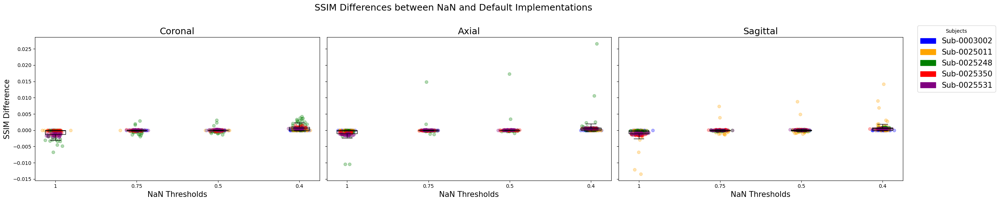

' \nWhen you compute \n𝐶=𝐴−𝐵 and most of the resulting values in \n𝐶 are positive, it means that the Structural Similarity Index (SSIM) scores in set 𝐴 are consistently higher than those in set 𝐵 for the majority of comparisons.\n'

In [16]:
PROPS = {
    'boxprops': {'facecolor': 'none', 'edgecolor': 'black'},
    'medianprops': {'color': 'black'},
    'whiskerprops': {'color': 'black'},
    'capprops': {'color': 'black'}
}

# Load the SNR data
# ssim_mask = pickle.load(open('/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/fondue_ssim_mask.pkl', 'rb'))
ssim_slices = pickle.load(open('/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/unpool_ssim_5subs.pkl', 'rb'))

# Set up the plot with 3 subplots, one for each plane
fig, axes = plt.subplots(1, 3, figsize=(25, 5), sharey=True)

# Define subject colors
subject_colors = ['blue', 'orange', 'green', 'red', 'purple']  # Colors for each subject
# subject_colors = ['blue', 'orange', ]  # Colors for each subject
subject_ids = ['0003002', '0025011', '0025248', '0025350', '0025531']  # Subject IDs
# subject_ids = ['0025011', '0025248', ]  # Subject IDs

# Iterate over the planes
for num, plane in enumerate(['coronal', 'axial', 'sagittal']):

    # Store aggregated data for each threshold across all subjects
    threshold_data = []

    # Loop through thresholds (excluding IEEE as it is the baseline)
    for thresh in ['1', '075', '05', '04']:
    # for thresh in [ '05', '1']:
        
        # Calculate SNR difference between each threshold and IEEE per subject
        ieee_values = np.array(ssim_slices[plane]['ieee'])  # Shape: (5, 256)
        thresh_values = np.array(ssim_slices[plane][thresh])  # Shape: (5, 256)
        snr_diff = thresh_values - ieee_values  # Shape: (5, 256)

        # Flatten snr_diff for all subjects and add to threshold_data
        threshold_data.append(snr_diff.flatten())

    threshold_data = np.nan_to_num(threshold_data)

    # Plot a single boxplot per threshold (aggregating all subjects)
    bplot = axes[num].boxplot(
        threshold_data.T,  # Aggregated data for each threshold
        positions=[1, 3, 5, 7],  # Position each threshold boxplot separately
        # positions=[1, 3],  # Position each threshold boxplot separately
        widths=0.5, patch_artist=True, showfliers=False, **PROPS)


    # Overlay scatter points for individual subject data
    for i, data in enumerate(threshold_data):
        for sub_idx in range(len(subject_ids)):
            y = data[sub_idx * 30:(sub_idx + 1) * 30]  # Data for one subject
            x = np.random.normal(loc=(i * 2 + 1), scale=0.1, size=len(y))  # Jitter points
            axes[num].scatter(x, y, alpha=0.3, color=subject_colors[sub_idx])

    # Set plot limits, labels, and title
    axes[num].set_title(plane.title(), fontsize=18)
    axes[num].set_xticks([1, 3, 5, 7])  # Position for each threshold
    # axes[num].set_xticks([1, 3])  # Position for each threshold
    axes[num].set_xticklabels(['1', '0.75', '0.5', '0.4'])
    # axes[num].set_xticklabels([ '0.5', '1'])
    axes[num].set_xlabel('NaN Thresholds', fontsize=15)

# Create custom legend for subjects
legend_patches = [mpatches.Patch(color=color, label=f'Sub-{sub_id}') for color, sub_id in zip(subject_colors, subject_ids)]
fig.legend(handles=legend_patches, loc='upper right', bbox_to_anchor=(1.1, 1), title='Subjects', fontsize=15)

# Configure the y-axis label
axes[0].set_ylabel('SSIM Difference', fontsize=15)

plt.tight_layout()
plt.suptitle('SSIM Differences between NaN and Default Implementations', fontsize=18, y=1.1)
plt.show()

""" 
When you compute 
𝐶=𝐴−𝐵 and most of the resulting values in 
𝐶 are positive, it means that the Structural Similarity Index (SSIM) scores in set 𝐴 are consistently higher than those in set 𝐵 for the majority of comparisons.
"""

**Examining Degradation For Thresholds 1-0.8**

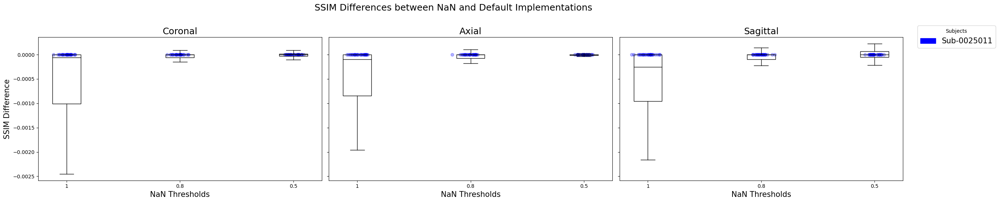

' \nWhen you compute \n𝐶=𝐴−𝐵 and most of the resulting values in \n𝐶 are positive, it means that the Structural Similarity Index (SSIM) scores in set 𝐴 are consistently higher than those in set 𝐵 for the majority of comparisons.\n'

In [ ]:
PROPS = {
    'boxprops': {'facecolor': 'none', 'edgecolor': 'black'},
    'medianprops': {'color': 'black'},
    'whiskerprops': {'color': 'black'},
    'capprops': {'color': 'black'}
}

# Load the SNR data
# ssim_mask = pickle.load(open('/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/fondue_ssim_mask.pkl', 'rb'))

# Set up the plot with 3 subplots, one for each plane
fig, axes = plt.subplots(1, 3, figsize=(25, 5), sharey=True)

# Define subject colors
subject_colors = ['blue', 'orange', 'green', 'red', 'purple']  # Colors for each subject
subject_colors = ['blue',  ]  # Colors for each subject
subject_ids = ['0003002', '0025011', '0025248', '0025350', '0025531']  # Subject IDs
subject_ids = ['0025011', ]  # Subject IDs

# Iterate over the planes
for num, plane in enumerate(['coronal', 'axial', 'sagittal']):

    # Store aggregated data for each threshold across all subjects
    threshold_data = []

    # Loop through thresholds (excluding IEEE as it is the baseline)
    for thresh in ['1', '08', '05',]:
    # for thresh in [ '05', '1']:
        
        # Calculate SNR difference between each threshold and IEEE per subject
        ieee_values = np.array(ssim_slices[plane]['ieee'])  # Shape: (5, 256)
        thresh_values = np.array(ssim_slices[plane][thresh])  # Shape: (5, 256)
        snr_diff = thresh_values - ieee_values  # Shape: (5, 256)

        # Flatten snr_diff for all subjects and add to threshold_data
        threshold_data.append(snr_diff.flatten())

    threshold_data = np.nan_to_num(threshold_data)

    # Plot a single boxplot per threshold (aggregating all subjects)
    bplot = axes[num].boxplot(
        threshold_data.T,  # Aggregated data for each threshold
        positions=[1, 3, 5, ],  # Position each threshold boxplot separately
        # positions=[1, 3],  # Position each threshold boxplot separately
        widths=0.5, patch_artist=True, showfliers=False, **PROPS)


    # Overlay scatter points for individual subject data
    for i, data in enumerate(threshold_data):
        for sub_idx in range(len(subject_ids)):
            y = data[sub_idx * 30:(sub_idx + 1) * 30]  # Data for one subject
            x = np.random.normal(loc=(i * 2 + 1), scale=0.1, size=len(y))  # Jitter points
            axes[num].scatter(x, y, alpha=0.3, color=subject_colors[sub_idx])

    # Set plot limits, labels, and title
    axes[num].set_title(plane.title(), fontsize=18)
    axes[num].set_xticks([1, 3, 5, ])  # Position for each threshold
    # axes[num].set_xticks([1, 3])  # Position for each threshold
    axes[num].set_xticklabels(['1', '0.8', '0.5', ])
    # axes[num].set_xticklabels([ '0.5', '1'])
    axes[num].set_xlabel('NaN Thresholds', fontsize=15)

# Create custom legend for subjects
legend_patches = [mpatches.Patch(color=color, label=f'Sub-{sub_id}') for color, sub_id in zip(subject_colors, subject_ids)]
fig.legend(handles=legend_patches, loc='upper right', bbox_to_anchor=(1.1, 1), title='Subjects', fontsize=15)

# Configure the y-axis label
axes[0].set_ylabel('SSIM Difference', fontsize=15)

plt.tight_layout()
plt.suptitle('SSIM Differences between NaN and Default Implementations', fontsize=18, y=1.1)
plt.show()

""" 
When you compute 
𝐶=𝐴−𝐵 and most of the resulting values in 
𝐶 are positive, it means that the Structural Similarity Index (SSIM) scores in set 𝐴 are consistently higher than those in set 𝐵 for the majority of comparisons.
"""

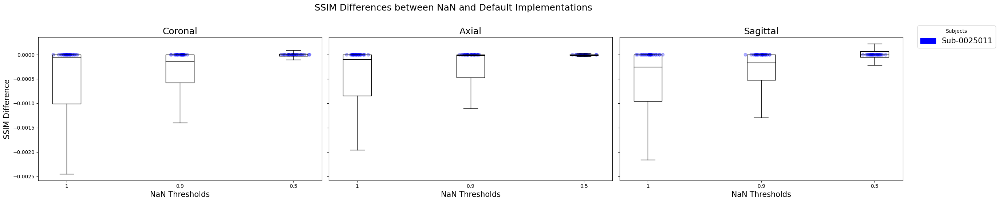

' \nWhen you compute \n𝐶=𝐴−𝐵 and most of the resulting values in \n𝐶 are positive, it means that the Structural Similarity Index (SSIM) scores in set 𝐴 are consistently higher than those in set 𝐵 for the majority of comparisons.\n'

In [ ]:
PROPS = {
    'boxprops': {'facecolor': 'none', 'edgecolor': 'black'},
    'medianprops': {'color': 'black'},
    'whiskerprops': {'color': 'black'},
    'capprops': {'color': 'black'}
}

# Load the SNR data
# ssim_mask = pickle.load(open('/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/fondue_ssim_mask.pkl', 'rb'))

# Set up the plot with 3 subplots, one for each plane
fig, axes = plt.subplots(1, 3, figsize=(25, 5), sharey=True)

# Define subject colors
subject_colors = ['blue', 'orange', 'green', 'red', 'purple']  # Colors for each subject
subject_colors = ['blue',  ]  # Colors for each subject
subject_ids = ['0003002', '0025011', '0025248', '0025350', '0025531']  # Subject IDs
subject_ids = ['0025011', ]  # Subject IDs

# Iterate over the planes
for num, plane in enumerate(['coronal', 'axial', 'sagittal']):

    # Store aggregated data for each threshold across all subjects
    threshold_data = []

    # Loop through thresholds (excluding IEEE as it is the baseline)
    for thresh in ['1', '09', '05',]:
    # for thresh in [ '05', '1']:
        
        # Calculate SNR difference between each threshold and IEEE per subject
        ieee_values = np.array(ssim_slices[plane]['ieee'])  # Shape: (5, 256)
        thresh_values = np.array(ssim_slices[plane][thresh])  # Shape: (5, 256)
        snr_diff = thresh_values - ieee_values  # Shape: (5, 256)

        # Flatten snr_diff for all subjects and add to threshold_data
        threshold_data.append(snr_diff.flatten())

    threshold_data = np.nan_to_num(threshold_data)

    # Plot a single boxplot per threshold (aggregating all subjects)
    bplot = axes[num].boxplot(
        threshold_data.T,  # Aggregated data for each threshold
        positions=[1, 3, 5, ],  # Position each threshold boxplot separately
        # positions=[1, 3],  # Position each threshold boxplot separately
        widths=0.5, patch_artist=True, showfliers=False, **PROPS)


    # Overlay scatter points for individual subject data
    for i, data in enumerate(threshold_data):
        for sub_idx in range(len(subject_ids)):
            y = data[sub_idx * 30:(sub_idx + 1) * 30]  # Data for one subject
            x = np.random.normal(loc=(i * 2 + 1), scale=0.1, size=len(y))  # Jitter points
            axes[num].scatter(x, y, alpha=0.3, color=subject_colors[sub_idx])

    # Set plot limits, labels, and title
    axes[num].set_title(plane.title(), fontsize=18)
    axes[num].set_xticks([1, 3, 5, ])  # Position for each threshold
    # axes[num].set_xticks([1, 3])  # Position for each threshold
    axes[num].set_xticklabels(['1', '0.9', '0.5', ])
    # axes[num].set_xticklabels([ '0.5', '1'])
    axes[num].set_xlabel('NaN Thresholds', fontsize=15)

# Create custom legend for subjects
legend_patches = [mpatches.Patch(color=color, label=f'Sub-{sub_id}') for color, sub_id in zip(subject_colors, subject_ids)]
fig.legend(handles=legend_patches, loc='upper right', bbox_to_anchor=(1.1, 1), title='Subjects', fontsize=15)

# Configure the y-axis label
axes[0].set_ylabel('SSIM Difference', fontsize=15)

plt.tight_layout()
plt.suptitle('SSIM Differences between NaN and Default Implementations', fontsize=18, y=1.1)
plt.show()

""" 
When you compute 
𝐶=𝐴−𝐵 and most of the resulting values in 
𝐶 are positive, it means that the Structural Similarity Index (SSIM) scores in set 𝐴 are consistently higher than those in set 𝐵 for the majority of comparisons.
"""

In [18]:
for i, data in enumerate(threshold_data):
    print(data.mean())

-0.0006781317
-2.1785218e-05
2.2133532e-05
0.0006494956


**NaN Pooling**

(4, 1280)
(4, 1280)
(4, 1280)


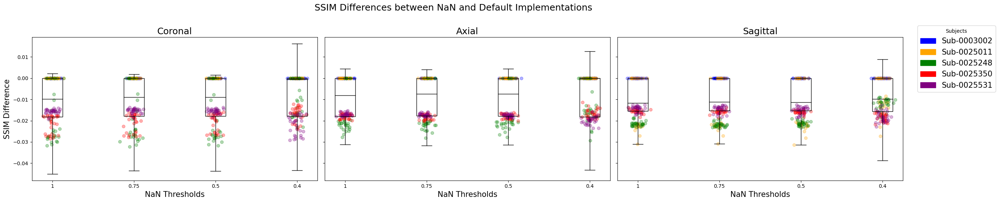

' \nWhen you compute \n𝐶=𝐴−𝐵 and most of the resulting values in \n𝐶 are positive, it means that the Structural Similarity Index (SSIM) scores in set 𝐴 are consistently higher than those in set 𝐵 for the majority of comparisons.\n'

In [6]:
PROPS = {
    'boxprops': {'facecolor': 'none', 'edgecolor': 'black'},
    'medianprops': {'color': 'black'},
    'whiskerprops': {'color': 'black'},
    'capprops': {'color': 'black'}
}

# Load the SNR data
# ssim_mask = pickle.load(open('/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/fondue_ssim_mask.pkl', 'rb'))

# Set up the plot with 3 subplots, one for each plane
fig, axes = plt.subplots(1, 3, figsize=(25, 5), sharey=True)

# Define subject colors
subject_colors = ['blue', 'orange', 'green', 'red', 'purple']  # Colors for each subject
# subject_colors = ['blue', 'orange', ]  # Colors for each subject
subject_ids = ['0003002', '0025011', '0025248', '0025350', '0025531']  # Subject IDs
# subject_ids = ['0025011', '0025248', ]  # Subject IDs

# Iterate over the planes
for num, plane in enumerate(['coronal', 'axial', 'sagittal']):

    # Store aggregated data for each threshold across all subjects
    threshold_data = []

    # Loop through thresholds (excluding IEEE as it is the baseline)
    for thresh in ['1', '075', '05', '04']:
    # for thresh in [ '05', '1']:
        
        # Calculate SNR difference between each threshold and IEEE per subject
        ieee_values = np.array(ssim_slices[plane]['ieee'])  # Shape: (5, 256)
        thresh_values = np.array(ssim_slices[plane][thresh])  # Shape: (5, 256)
        snr_diff = thresh_values - ieee_values  # Shape: (5, 256)

        # Flatten snr_diff for all subjects and add to threshold_data
        threshold_data.append(snr_diff.flatten())

    threshold_data = np.nan_to_num(threshold_data)
    print(threshold_data.shape)

    # Plot a single boxplot per threshold (aggregating all subjects)
    bplot = axes[num].boxplot(
        threshold_data.T,  # Aggregated data for each threshold
        positions=[1, 3, 5, 7],  # Position each threshold boxplot separately
        # positions=[1, 3],  # Position each threshold boxplot separately
        widths=0.5, patch_artist=True, showfliers=False, **PROPS)


    # Overlay scatter points for individual subject data
    for i, data in enumerate(threshold_data):
        for sub_idx in range(len(subject_ids)):
            y = data[sub_idx * 30:(sub_idx + 1) * 30]  # Data for one subject
            x = np.random.normal(loc=(i * 2 + 1), scale=0.1, size=len(y))  # Jitter points
            axes[num].scatter(x, y, alpha=0.3, color=subject_colors[sub_idx])

    # Set plot limits, labels, and title
    axes[num].set_title(plane.title(), fontsize=18)
    axes[num].set_xticks([1, 3, 5, 7])  # Position for each threshold
    # axes[num].set_xticks([1, 3])  # Position for each threshold
    axes[num].set_xticklabels(['1', '0.75', '0.5', '0.4'])
    # axes[num].set_xticklabels([ '0.5', '1'])
    axes[num].set_xlabel('NaN Thresholds', fontsize=15)

# Create custom legend for subjects
legend_patches = [mpatches.Patch(color=color, label=f'Sub-{sub_id}') for color, sub_id in zip(subject_colors, subject_ids)]
fig.legend(handles=legend_patches, loc='upper right', bbox_to_anchor=(1.1, 1), title='Subjects', fontsize=15)

# Configure the y-axis label
axes[0].set_ylabel('SSIM Difference', fontsize=15)

plt.tight_layout()
plt.suptitle('SSIM Differences between NaN and Default Implementations', fontsize=18, y=1.1)
plt.show()

""" 
When you compute 
𝐶=𝐴−𝐵 and most of the resulting values in 
𝐶 are positive, it means that the Structural Similarity Index (SSIM) scores in set 𝐴 are consistently higher than those in set 𝐵 for the majority of comparisons.
"""

## FastSurfer

### SkipCount

In [6]:
def count_skipped_ops(filename):

    # tmp = int(filename.split('.log')[0].split('_')[-1])
    # if tmp in [36, 171, 241, 136, 167, 235, 248, 106, 221, 16, 54, 61, 134, 168, 17, 49, 85, 103, 150, 221]: return None

    # print(filename)
    f = open(filename, 'r')

    skip_count = {}
    start_printing = False
    conv_counter = 0

    for line in f: 
        line = line.strip()
        if 'Input' in line:
            start_printing = True
        if start_printing:
            if 'Input' in line or 'Encode' in line or 'Bottle' in line or 'Decode' in line or 'Output block' in line or 'Classifier' in line: 
                block = line.split(': ')[-1]
                skip_count[block] = {}
                conv_counter = 0

            if 'SKIP' in line:
                tmp = line.split('count ')[-1].strip('()').split(', ')
                skip_count[block][conv_counter] = {'Count': int(tmp[0]), 'Total': int(tmp[1]), 'Ratio': float(int(tmp[0])/int(tmp[1])) }
                conv_counter += 1

    block_counter = {}
    for block in ['Input', 'Encode1', 'Encode2', 'Encode3', 'Encode4', 'Bottleneck', 'Decode4', 'Decode3', 'Decode2', 'Decode1', 'Output block', 'Classifier']:
        block_counter[block] = {"Labels": [], "Ratio": []}
        for num, r in skip_count[block].items():
            # print(r)
            block_counter[block]["Labels"].append(f"Conv {num}")
            block_counter[block]["Ratio"].append(float(r['Ratio']))

    return block_counter


def aggregate_mean_ratios(dictionaries):
    # Initialize a dictionary to store aggregated ratio values for each convolutional layer
    aggregated_ratios = {}
    
    # Iterate through each dictionary
    for dictionary in dictionaries:
        # print(dictionary)
        if dictionary is None: continue
        for layer in dictionary:
            # Extract labels and ratio values
            labels = dictionary[layer].get('Labels', [])
            ratios = dictionary[layer].get('Ratio', [])

            if layer not in aggregated_ratios.keys(): 
                aggregated_ratios[layer] = {}
            
            # Iterate through labels and corresponding ratio values
            for label, ratio in zip(labels, ratios):
                # If label already exists in aggregated_ratios, add ratio value to list
                if label in aggregated_ratios[layer]:
                    aggregated_ratios[layer][label].append(ratio)
                # If label is new, initialize list with ratio value
                else:
                    aggregated_ratios[layer][label] = [ratio]
    
    # Calculate mean ratio for each convolutional layer
    mean_ratios = {}
    for layer in aggregated_ratios:
        mean_ratios[layer] = {}
        for label, ratios in aggregated_ratios[layer].items():
            mean_ratios[layer][label] = [sum(ratios) / len(ratios)]
    
    return aggregated_ratios, mean_ratios


def nanratio_per_slice(aggregated_ratios, trim, title, axes):


    avg_slice = {}
    std_slice = {}
    for thresh in aggregated_ratios:
        avg_slice[thresh] = {}
        std_slice[thresh] = {}

        # print(len(aggregated_ratios[thresh]))
        # print(aggregated_ratios[thresh][1])

        for num, sub in enumerate(aggregated_ratios[thresh]):
            # print(sub)
            # print(type(sub))
            avg_slice[thresh][num] = []
            std_slice[thresh][num] = []

            for slice in sub:

                nanratio = []
                # print(slice.keys())
                for block in slice:
                    # trim architecture to relevant blocks
                    if trim:
                        pattern = r"Encode2|Encode3|Encode4|Bottleneck|Decode4|Decode3"

                        if re.search(pattern, block):
                            # print(slice[block]['Ratio'])
                            nanratio.extend(slice[block]['Ratio'])
                    else:
                        nanratio.append(slice[block]['Ratio'])
                        # print(len(slice[block]['Ratio']))

                
                avg_slice[thresh][num].append( np.concatenate( [np.array(nanratio[:11]).mean(1), np.array(nanratio[11:]).mean(1) ]) )
                # std_slice[thresh][num].append(np.std(nanratio))

                # nanratio = np.array(nanratio).ravel()
                # print(nanratio)
                # break

        # print(np.array(list(avg_slice[thresh].values())).shape)
        avg = np.array(list(avg_slice[thresh].values())).mean(-1).mean(0)
        stdev = np.array(list(avg_slice[thresh].values())).mean(-1).std(0)
        
        axes.plot(avg, label=f'Threshold {thresh}')
        axes.fill_between(range(len(avg)), avg - stdev, avg + stdev, alpha=0.3)
        axes.set_ylim(-0.1,1)
        axes.set_title(f'{title}', fontsize=60)
        axes.tick_params(axis='both', labelsize=40)
        # axes.set_xlabel('Brain Slices', fontsize=40)
        # axes.set_xticks(np.arange(len(avg_slice[thresh])), list(avg_slice[thresh]), rotation=30);


def average_block_ratio(aggregated_ratios, title, axes):
    # avg_thresh = {'0': [], '0.2': [], '0.5': [], '0.8': [], '1': []}
    # avg_thresh = {'0.2': [], '0.5': [], '0.8': [], '1': []}
    # avg_thresh = {'0.5': [], '1': []}    

    for thresh in aggregated_ratios:
        avg_thresh = {thresh: {}}
        std_thresh = {thresh: {}}
        # subs_thresh = {thresh: {}}

        for block in ['Input', 'Encode1', 'Encode2', 'Encode3', 'Encode4', 'Bottleneck', 'Decode4', 'Decode3', 'Decode2', 'Decode1', 'Output block', 'Classifier']:

            avg_thresh[thresh][block] = []
            std_thresh[thresh][block] = []

            for num, sub in enumerate(aggregated_ratios[thresh]):
                avg_thresh[thresh][block].append( np.array(list(sub[block].values())).reshape(1,-1) )

        arr1 = np.array(list(avg_thresh[thresh].values())[:11]).squeeze().mean(axis=-1) # most of model has 4 convolutions per block
        arr2 = np.array(list(avg_thresh[thresh].values())[11:]).squeeze(-1).squeeze(-1) # classifier portion of model has different shape, only one convolution

        # Concatenate along axis=0 (rows)
        avg = np.concatenate([arr1, arr2], axis=0).mean(1)
        stdev = np.concatenate([arr1, arr2], axis=0).std(1)

        axes.plot(avg, marker='o', label=f'Threshold {thresh}')
        axes.fill_between(range(len(avg)), avg - stdev, avg + stdev, alpha=0.3)
        axes.set_ylim(-0.1,1)
        axes.tick_params(axis='y', labelsize=40)
        axes.set_title(f'{title}', fontsize=60)
        axes.set_xticks(np.arange(len(avg) ), list(avg_thresh[thresh].keys()), rotation=60, fontsize=40)
        # axes.set_xlabel('Model Layers', fontsize=40)

        # axes.legend();




#### Run Skip Count

In [7]:
# THRESH 05
axial_0025531_thresh05 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh05/5subs/axial_1_{i}.log') for i in range(256)]  
axial_0003002_thresh05 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh05/5subs/axial_2_{i}.log') for i in range(256)]  
axial_0025011_thresh05 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh05/5subs/axial_3_{i}.log') for i in range(256)]  
axial_0025248_thresh05 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh05/5subs/axial_4_{i}.log') for i in range(256)]  
axial_0025350_thresh05 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh05/5subs/axial_5_{i}.log') for i in range(256)]  


coronal_0025531_thresh05 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh05/5subs/coronal_1_{i}.log') for i in range(256)]  
coronal_0003002_thresh05 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh05/5subs/coronal_2_{i}.log') for i in range(256)]  
coronal_0025011_thresh05 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh05/5subs/coronal_3_{i}.log') for i in range(256)]  
coronal_0025248_thresh05 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh05/5subs/coronal_4_{i}.log') for i in range(256)]  
coronal_0025350_thresh05 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh05/5subs/coronal_5_{i}.log') for i in range(256)]  


sagittal_0025531_thresh05 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh05/5subs/sagittal_1_{i}.log') for i in range(256)]  
sagittal_0003002_thresh05 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh05/5subs/sagittal_2_{i}.log') for i in range(256)]  
sagittal_0025011_thresh05 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh05/5subs/sagittal_3_{i}.log') for i in range(256)]  
sagittal_0025248_thresh05 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh05/5subs/sagittal_4_{i}.log') for i in range(256)]  
sagittal_0025350_thresh05 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh05/5subs/sagittal_5_{i}.log') for i in range(256)]  

# THRESH 1
axial_0025531_thresh1 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh1/5subs/axial_1_{i}.log') for i in range(256)]  
axial_0003002_thresh1 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh1/5subs/axial_2_{i}.log') for i in range(256)]  
axial_0025011_thresh1 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh1/5subs/axial_3_{i}.log') for i in range(256)]  
axial_0025248_thresh1 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh1/5subs/axial_4_{i}.log') for i in range(256)]  
axial_0025350_thresh1 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh1/5subs/axial_5_{i}.log') for i in range(256)]  


coronal_0025531_thresh1 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh1/5subs/coronal_1_{i}.log') for i in range(256) if i != 201]  
coronal_0003002_thresh1 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh1/5subs/coronal_2_{i}.log') for i in range(256) if i != 201]  
coronal_0025011_thresh1 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh1/5subs/coronal_3_{i}.log') for i in range(256) if i != 201]   
coronal_0025248_thresh1 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh1/5subs/coronal_4_{i}.log') for i in range(256) if i != 201]  
coronal_0025350_thresh1 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh1/5subs/coronal_5_{i}.log') for i in range(256) if i != 201]  


sagittal_0025531_thresh1 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh1/5subs/sagittal_1_{i}.log') for i in range(256)]  
sagittal_0003002_thresh1 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh1/5subs/sagittal_2_{i}.log') for i in range(256)]  
sagittal_0025011_thresh1 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh1/5subs/sagittal_3_{i}.log') for i in range(256)]  
sagittal_0025248_thresh1 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh1/5subs/sagittal_4_{i}.log') for i in range(256)]  
sagittal_0025350_thresh1 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh1/5subs/sagittal_5_{i}.log') for i in range(256)]  

# THRESH 04
axial_0025531_thresh04 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh04/5subs/axial_1_{i}.log') for i in range(256)]  
axial_0003002_thresh04 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh04/5subs/axial_2_{i}.log') for i in range(256)]  
axial_0025011_thresh04 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh04/5subs/axial_3_{i}.log') for i in range(256)]  
axial_0025248_thresh04 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh04/5subs/axial_4_{i}.log') for i in range(256)]  
axial_0025350_thresh04 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh04/5subs/axial_5_{i}.log') for i in range(256)]  


coronal_0025531_thresh04 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh04/5subs/coronal_1_{i}.log') for i in range(256)]  
coronal_0003002_thresh04 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh04/5subs/coronal_2_{i}.log') for i in range(256)]  
coronal_0025011_thresh04 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh04/5subs/coronal_3_{i}.log') for i in range(256)]  
coronal_0025248_thresh04 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh04/5subs/coronal_4_{i}.log') for i in range(256)]  
coronal_0025350_thresh04 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh04/5subs/coronal_5_{i}.log') for i in range(256)]  


sagittal_0025531_thresh04 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh04/5subs/sagittal_1_{i}.log') for i in range(256)]  
sagittal_0003002_thresh04 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh04/5subs/sagittal_2_{i}.log') for i in range(256)]  
sagittal_0025011_thresh04 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh04/5subs/sagittal_3_{i}.log') for i in range(256)]  
sagittal_0025248_thresh04 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh04/5subs/sagittal_4_{i}.log') for i in range(256)]  
sagittal_0025350_thresh04 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh04/5subs/sagittal_5_{i}.log') for i in range(256)]  

# THRESH 08
axial_0025531_thresh08 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh08/5subs/axial_1_{i}.log') for i in range(256)]  
axial_0003002_thresh08 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh08/5subs/axial_2_{i}.log') for i in range(256)]  
axial_0025011_thresh08 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh08/5subs/axial_3_{i}.log') for i in range(256)]  
axial_0025248_thresh08 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh08/5subs/axial_4_{i}.log') for i in range(256)]  
axial_0025350_thresh08 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh08/5subs/axial_5_{i}.log') for i in range(256)]  


coronal_0025531_thresh08 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh08/5subs/coronal_1_{i}.log') for i in range(256) ]  
coronal_0003002_thresh08 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh08/5subs/coronal_2_{i}.log') for i in range(256) ]  
coronal_0025011_thresh08 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh08/5subs/coronal_3_{i}.log') for i in range(256) ]   
coronal_0025248_thresh08 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh08/5subs/coronal_4_{i}.log') for i in range(256) ]  
coronal_0025350_thresh08 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh08/5subs/coronal_5_{i}.log') for i in range(256) ]  


sagittal_0025531_thresh08 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh08/5subs/sagittal_1_{i}.log') for i in range(256)]  
sagittal_0003002_thresh08 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh08/5subs/sagittal_2_{i}.log') for i in range(256)]  
sagittal_0025011_thresh08 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh08/5subs/sagittal_3_{i}.log') for i in range(256)]  
sagittal_0025248_thresh08 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh08/5subs/sagittal_4_{i}.log') for i in range(256)]  
sagittal_0025350_thresh08 = [count_skipped_ops(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/allsubs_unpool_skipconv/thresh08/5subs/sagittal_5_{i}.log') for i in range(256)]  




In [ ]:
thresh_sub = { 
    "1": {
        "subjects": ['0025531', '0003002', '0025011', '0025248', '0025350' ],
        "axial": [axial_0025531_thresh1, axial_0003002_thresh1, axial_0025011_thresh1, axial_0025248_thresh1, axial_0025350_thresh1],
        "coronal": [coronal_0025531_thresh1, coronal_0003002_thresh1, coronal_0025011_thresh1, coronal_0025248_thresh1, coronal_0025350_thresh1],
        "sagittal": [sagittal_0025531_thresh1, sagittal_0003002_thresh1, sagittal_0025011_thresh1, sagittal_0025248_thresh1, sagittal_0025350_thresh1]
    },
    "05": {
        "subjects": ['0025531', '0003002', '0025011', '0025248', '0025350' ],
        "axial": [axial_0025531_thresh05, axial_0003002_thresh05, axial_0025011_thresh05, axial_0025248_thresh05, axial_0025350_thresh05],
        "coronal": [coronal_0025531_thresh05, coronal_0003002_thresh05, coronal_0025011_thresh05, coronal_0025248_thresh05, coronal_0025350_thresh05],
        "sagittal": [sagittal_0025531_thresh05, sagittal_0003002_thresh05, sagittal_0025011_thresh05, sagittal_0025248_thresh05, sagittal_0025350_thresh05]
    },
    "08": {
        "subjects": ['0025531', '0003002', '0025011', '0025248', '0025350' ],
        "axial": [axial_0025531_thresh08, axial_0003002_thresh08, axial_0025011_thresh08, axial_0025248_thresh08, axial_0025350_thresh08],
        "coronal": [coronal_0025531_thresh08, coronal_0003002_thresh08, coronal_0025011_thresh08, coronal_0025248_thresh08, coronal_0025350_thresh08],
        "sagittal": [sagittal_0025531_thresh08, sagittal_0003002_thresh08, sagittal_0025011_thresh08, sagittal_0025248_thresh08, sagittal_0025350_thresh08]
    },
    "04": {
        "subjects": ['0025531', '0003002', '0025011', '0025248', '0025350' ],
        "axial": [axial_0025531_thresh04, axial_0003002_thresh04, axial_0025011_thresh04, axial_0025248_thresh04, axial_0025350_thresh04],
        "coronal": [coronal_0025531_thresh04, coronal_0003002_thresh04, coronal_0025011_thresh04, coronal_0025248_thresh04, coronal_0025350_thresh04],
        "sagittal": [sagittal_0025531_thresh04, sagittal_0003002_thresh04, sagittal_0025011_thresh04, sagittal_0025248_thresh04, sagittal_0025350_thresh04]
    },
}

pickle.dump(thresh_sub, open('/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/fastsurfer_skipcount.pkl', 'wb'))

#### Load up SkipCount

In [47]:
thresh_sub = pickle.load(open('/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/fastsurfer_skipcount.pkl', 'rb'))
for thresh in thresh_sub:
    if thresh == '1':
        axial_0025531_thresh1 = thresh_sub[thresh]['axial'][0]
        axial_0003002_thresh1 = thresh_sub[thresh]['axial'][1] 
        axial_0025011_thresh1 = thresh_sub[thresh]['axial'][2] 
        axial_0025248_thresh1 = thresh_sub[thresh]['axial'][3] 
        axial_0025350_thresh1 = thresh_sub[thresh]['axial'][4]

        coronal_0025531_thresh1 = thresh_sub[thresh]['coronal'][0]
        coronal_0003002_thresh1 = thresh_sub[thresh]['coronal'][1]
        coronal_0025011_thresh1 = thresh_sub[thresh]['coronal'][2] 
        coronal_0025248_thresh1 = thresh_sub[thresh]['coronal'][3] 
        coronal_0025350_thresh1 = thresh_sub[thresh]['coronal'][4]

        sagittal_0025531_thresh1 = thresh_sub[thresh]['sagittal'][0] 
        sagittal_0003002_thresh1 = thresh_sub[thresh]['sagittal'][1]  
        sagittal_0025011_thresh1 = thresh_sub[thresh]['sagittal'][2] 
        sagittal_0025248_thresh1 = thresh_sub[thresh]['sagittal'][3]  
        sagittal_0025350_thresh1 = thresh_sub[thresh]['sagittal'][4]
    elif thresh == '08': 
        axial_0025531_thresh08 = thresh_sub[thresh]['axial'][0]
        axial_0003002_thresh08 = thresh_sub[thresh]['axial'][1] 
        axial_0025011_thresh08 = thresh_sub[thresh]['axial'][2] 
        axial_0025248_thresh08 = thresh_sub[thresh]['axial'][3] 
        axial_0025350_thresh08 = thresh_sub[thresh]['axial'][4]

        coronal_0025531_thresh08 = thresh_sub[thresh]['coronal'][0]
        coronal_0003002_thresh08 = thresh_sub[thresh]['coronal'][1]
        coronal_0025011_thresh08 = thresh_sub[thresh]['coronal'][2] 
        coronal_0025248_thresh08 = thresh_sub[thresh]['coronal'][3] 
        coronal_0025350_thresh08 = thresh_sub[thresh]['coronal'][4]

        sagittal_0025531_thresh08 = thresh_sub[thresh]['sagittal'][0] 
        sagittal_0003002_thresh08 = thresh_sub[thresh]['sagittal'][1]  
        sagittal_0025011_thresh08 = thresh_sub[thresh]['sagittal'][2] 
        sagittal_0025248_thresh08 = thresh_sub[thresh]['sagittal'][3]  
        sagittal_0025350_thresh08 = thresh_sub[thresh]['sagittal'][4]
    elif thresh == '05': 
        axial_0025531_thresh05 = thresh_sub[thresh]['axial'][0]
        axial_0003002_thresh05 = thresh_sub[thresh]['axial'][1] 
        axial_0025011_thresh05 = thresh_sub[thresh]['axial'][2] 
        axial_0025248_thresh05 = thresh_sub[thresh]['axial'][3] 
        axial_0025350_thresh05 = thresh_sub[thresh]['axial'][4]

        coronal_0025531_thresh05 = thresh_sub[thresh]['coronal'][0]
        coronal_0003002_thresh05 = thresh_sub[thresh]['coronal'][1]
        coronal_0025011_thresh05 = thresh_sub[thresh]['coronal'][2] 
        coronal_0025248_thresh05 = thresh_sub[thresh]['coronal'][3] 
        coronal_0025350_thresh05 = thresh_sub[thresh]['coronal'][4]

        sagittal_0025531_thresh05 = thresh_sub[thresh]['sagittal'][0] 
        sagittal_0003002_thresh05 = thresh_sub[thresh]['sagittal'][1]  
        sagittal_0025011_thresh05 = thresh_sub[thresh]['sagittal'][2] 
        sagittal_0025248_thresh05 = thresh_sub[thresh]['sagittal'][3]  
        sagittal_0025350_thresh05 = thresh_sub[thresh]['sagittal'][4]
    elif thresh == '04': 
        axial_0025531_thresh04 = thresh_sub[thresh]['axial'][0]
        axial_0003002_thresh04 = thresh_sub[thresh]['axial'][1] 
        axial_0025011_thresh04 = thresh_sub[thresh]['axial'][2] 
        axial_0025248_thresh04 = thresh_sub[thresh]['axial'][3] 
        axial_0025350_thresh04 = thresh_sub[thresh]['axial'][4]

        coronal_0025531_thresh04 = thresh_sub[thresh]['coronal'][0]
        coronal_0003002_thresh04 = thresh_sub[thresh]['coronal'][1]
        coronal_0025011_thresh04 = thresh_sub[thresh]['coronal'][2] 
        coronal_0025248_thresh04 = thresh_sub[thresh]['coronal'][3] 
        coronal_0025350_thresh04 = thresh_sub[thresh]['coronal'][4]

        sagittal_0025531_thresh04 = thresh_sub[thresh]['sagittal'][0] 
        sagittal_0003002_thresh04 = thresh_sub[thresh]['sagittal'][1]  
        sagittal_0025011_thresh04 = thresh_sub[thresh]['sagittal'][2] 
        sagittal_0025248_thresh04 = thresh_sub[thresh]['sagittal'][3]  
        sagittal_0025350_thresh04 = thresh_sub[thresh]['sagittal'][4]



In [11]:
# 0025531, 0003002, 0025011, 0025248, 0025350

# THRESH 04
tmp = np.array( [ aggregate_mean_ratios(sub) for sub in  [axial_0025531_thresh04, axial_0003002_thresh04, axial_0025011_thresh04, axial_0025248_thresh04, axial_0025350_thresh04] ] )
axial_aggregated_ratios_thresh04 = tmp[:, 0] 
axial_mean_ratios_thresh04 = tmp[:, 1]

tmp = np.array( [ aggregate_mean_ratios(sub) for sub in  [coronal_0025531_thresh04, coronal_0003002_thresh04, coronal_0025011_thresh04, coronal_0025248_thresh04, coronal_0025350_thresh04] ] )
coronal_aggregated_ratios_thresh04 = tmp[:, 0] 
coronal_mean_ratios_thresh04 = tmp[:, 1]

tmp = np.array( [ aggregate_mean_ratios(sub) for sub in  [sagittal_0025531_thresh04, sagittal_0003002_thresh04, sagittal_0025011_thresh04, sagittal_0025248_thresh04, sagittal_0025350_thresh04] ] )
sagittal_aggregated_ratios_thresh04 = tmp[:, 0] 
sagittal_mean_ratios_thresh04 = tmp[:, 1]

# THRESH 05
tmp = np.array( [ aggregate_mean_ratios(sub) for sub in  [axial_0025531_thresh05, axial_0003002_thresh05, axial_0025011_thresh05, axial_0025248_thresh05, axial_0025350_thresh05] ] )
axial_aggregated_ratios_thresh05 = tmp[:, 0] 
axial_mean_ratios_thresh05 = tmp[:, 1]

tmp = np.array( [ aggregate_mean_ratios(sub) for sub in  [coronal_0025531_thresh05, coronal_0003002_thresh05, coronal_0025011_thresh05, coronal_0025248_thresh05, coronal_0025350_thresh05] ] )
coronal_aggregated_ratios_thresh05 = tmp[:, 0] 
coronal_mean_ratios_thresh05 = tmp[:, 1]

tmp = np.array( [ aggregate_mean_ratios(sub) for sub in  [sagittal_0025531_thresh05, sagittal_0003002_thresh05, sagittal_0025011_thresh05, sagittal_0025248_thresh05, sagittal_0025350_thresh05] ] )
sagittal_aggregated_ratios_thresh05 = tmp[:, 0] 
sagittal_mean_ratios_thresh05 = tmp[:, 1]

# THRESH 08
tmp = np.array( [ aggregate_mean_ratios(sub) for sub in  [axial_0025531_thresh08, axial_0003002_thresh08, axial_0025011_thresh08, axial_0025248_thresh08, axial_0025350_thresh08] ] )
axial_aggregated_ratios_thresh08 = tmp[:, 0] 
axial_mean_ratios_thresh08 = tmp[:, 1]

tmp = np.array( [ aggregate_mean_ratios(sub) for sub in  [coronal_0025531_thresh08, coronal_0003002_thresh08, coronal_0025011_thresh08, coronal_0025248_thresh08, coronal_0025350_thresh08] ] )
coronal_aggregated_ratios_thresh08 = tmp[:, 0] 
coronal_mean_ratios_thresh08 = tmp[:, 1]

tmp = np.array( [ aggregate_mean_ratios(sub) for sub in  [sagittal_0025531_thresh08, sagittal_0003002_thresh08, sagittal_0025011_thresh08, sagittal_0025248_thresh08, sagittal_0025350_thresh08] ] )
sagittal_aggregated_ratios_thresh08 = tmp[:, 0] 
sagittal_mean_ratios_thresh08 = tmp[:, 1]

# THRESH 1
tmp = np.array( [ aggregate_mean_ratios(sub) for sub in  [axial_0025531_thresh1, axial_0003002_thresh1, axial_0025011_thresh1, axial_0025248_thresh1, axial_0025350_thresh1] ] )
axial_aggregated_ratios_thresh1 = tmp[:, 0] 
axial_mean_ratios_thresh1 = tmp[:, 1]

tmp = np.array( [ aggregate_mean_ratios(sub) for sub in  [coronal_0025531_thresh1, coronal_0003002_thresh1, coronal_0025011_thresh1, coronal_0025248_thresh1, coronal_0025350_thresh1] ] )
coronal_aggregated_ratios_thresh1 = tmp[:, 0] 
coronal_mean_ratios_thresh1 = tmp[:, 1]

tmp = np.array( [ aggregate_mean_ratios(sub) for sub in  [sagittal_0025531_thresh1, sagittal_0003002_thresh1, sagittal_0025011_thresh1, sagittal_0025248_thresh1, sagittal_0025350_thresh1] ] )
sagittal_aggregated_ratios_thresh1 = tmp[:, 0] 
sagittal_mean_ratios_thresh1 = tmp[:, 1]

#### Visualization

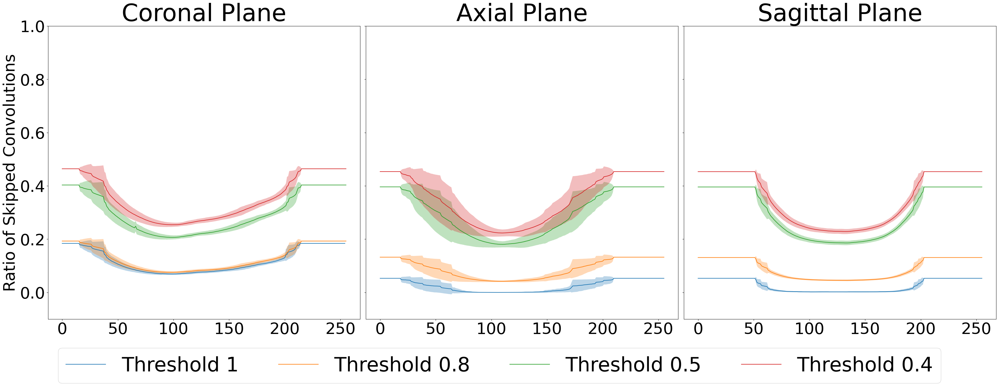

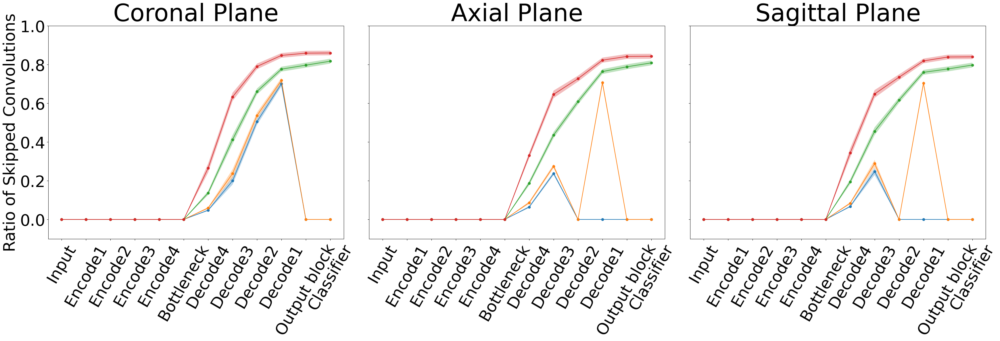

In [14]:
#nanratio per slice
fig, axes = plt.subplots(1, 3, figsize=(35,12), sharey=True)
nanratio_per_slice({'1': [coronal_0025531_thresh1, coronal_0003002_thresh1, coronal_0025011_thresh1, coronal_0025248_thresh1, coronal_0025350_thresh1 ] ,
                    '0.8': [coronal_0025531_thresh08, coronal_0003002_thresh08, coronal_0025011_thresh08, coronal_0025248_thresh08, coronal_0025350_thresh08 ],
                    '0.5': [coronal_0025531_thresh05, coronal_0003002_thresh05, coronal_0025011_thresh05, coronal_0025248_thresh05, coronal_0025350_thresh05 ],
                    '0.4': [coronal_0025531_thresh04, coronal_0003002_thresh04, coronal_0025011_thresh04, coronal_0025248_thresh04, coronal_0025350_thresh04 ],
                    }, trim=False, title='Coronal Plane', axes=axes[0])
nanratio_per_slice({'1': [axial_0025531_thresh1, axial_0003002_thresh1, axial_0025011_thresh1, axial_0025248_thresh1, axial_0025350_thresh1 ] ,
                    '0.8': [axial_0025531_thresh08, axial_0003002_thresh08, axial_0025011_thresh08, axial_0025248_thresh08, axial_0025350_thresh08 ],
                    '0.5': [axial_0025531_thresh05, axial_0003002_thresh05, axial_0025011_thresh05, axial_0025248_thresh05, axial_0025350_thresh05 ], 
                    '0.4': [axial_0025531_thresh04, axial_0003002_thresh04, axial_0025011_thresh04, axial_0025248_thresh04, axial_0025350_thresh04 ],
                    }, trim=False, title='Axial Plane', axes=axes[1])
nanratio_per_slice({'1': [sagittal_0025531_thresh1, sagittal_0003002_thresh1, sagittal_0025011_thresh1, sagittal_0025248_thresh1, sagittal_0025350_thresh1 ],
                    '0.8': [sagittal_0025531_thresh08, sagittal_0003002_thresh08, sagittal_0025011_thresh08, sagittal_0025248_thresh08, sagittal_0025350_thresh08 ],
                    '0.5': [sagittal_0025531_thresh05, sagittal_0003002_thresh05, sagittal_0025011_thresh05, sagittal_0025248_thresh05, sagittal_0025350_thresh05 ],
                    '0.4': [sagittal_0025531_thresh04, sagittal_0003002_thresh04, sagittal_0025011_thresh04, sagittal_0025248_thresh04, sagittal_0025350_thresh04 ], 
                    }, trim=False, title='Sagittal Plane', axes=axes[2])



axes[0].set_ylabel('Ratio of Skipped Convolutions', fontsize=40)
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, prop={'size': 50}, loc='lower center', bbox_to_anchor=(0.5, -0.15), ncol=4)
# plt.suptitle(f'Mean Skipped Count Operations Across Slices (Full Architecture)'), axes[2].legend(loc="upper left", bbox_to_anchor=(1, 1));
plt.tight_layout()
plt.savefig('/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/figures/nanunpool_per_slice.pdf', format="pdf", bbox_inches="tight")

#nanratio per architecture
fig, axes = plt.subplots(1, 3, figsize=(35,12), sharey=True)


average_block_ratio({
                     '1': coronal_mean_ratios_thresh1,
                     '0.8': coronal_mean_ratios_thresh08, 
                     '0.5': coronal_mean_ratios_thresh05,
                     '0.4': coronal_mean_ratios_thresh04,
                     }, title='Coronal Plane', axes=axes[0]) 
average_block_ratio({'1': axial_mean_ratios_thresh1, 
                     '0.8': axial_mean_ratios_thresh08, 
                     '0.5': axial_mean_ratios_thresh05,
                     '0.4': axial_mean_ratios_thresh04,
                     }, 
                     title='Axial Plane', axes=axes[1]) 
average_block_ratio({
                     '1': sagittal_mean_ratios_thresh1, 
                     '0.8': sagittal_mean_ratios_thresh08, 
                     '0.5': sagittal_mean_ratios_thresh05, 
                     '0.4': sagittal_mean_ratios_thresh04, 
                     }, title='Sagittal Plane', axes=axes[2]) 


axes[0].set_ylabel('Ratio of Skipped Convolutions', fontsize=40)
# plt.suptitle(f'Mean Skipped Count Operations Across Model'), axes[2].legend(loc="upper left", bbox_to_anchor=(1, 1));
handles, labels = axes[0].get_legend_handles_labels()
# fig.legend(handles, labels, prop={'size': 50}, loc='lower center', bbox_to_anchor=(0.5, -0.15), ncol=4)
plt.tight_layout()
plt.savefig('/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/figures/nanunpool_per_architecture.pdf', format="pdf", bbox_inches="tight")



In [13]:
def total_percentage(allsubs_ratio):

    total_perc = {}
    trimmed_perc = {}
    pattern = r"Decode4|Decode3|Decode2|Decode1|Classifier"

    for thresh in allsubs_ratio:

        total_perc[thresh] = []
        trimmed_perc[thresh] = []

        for slices in allsubs_ratio[thresh]:

            for sub in slices:
                for block in sub.items():
                    # print(block)
                    # break

                    total_perc[thresh].extend(block[1]['Ratio'])

                    if re.search(pattern, block[0]):
                        trimmed_perc[thresh].extend(block[1]['Ratio'])
            #     break
            # break

        # print( len(total_perc['1']) )
        print(f"Threshold {thresh} total skipped convolutions: {np.mean(total_perc[thresh])*100:.5f}")
        print(f"Threshold {thresh} total skipped convolutions for relevant layers: {np.mean(trimmed_perc[thresh])*100:.5f}")

total_percentage( {
                    '04': [axial_0025531_thresh04, axial_0003002_thresh04, axial_0025011_thresh04, axial_0025248_thresh04, axial_0025350_thresh04,
                          coronal_0025531_thresh04, coronal_0003002_thresh04, coronal_0025011_thresh04, coronal_0025248_thresh04, coronal_0025350_thresh04,
                          sagittal_0025531_thresh04, sagittal_0003002_thresh04, sagittal_0025011_thresh04, sagittal_0025248_thresh04, sagittal_0025350_thresh04  ], 
                    '05': [axial_0025531_thresh05, axial_0003002_thresh05, axial_0025011_thresh05, axial_0025248_thresh05, axial_0025350_thresh05,
                          coronal_0025531_thresh05, coronal_0003002_thresh05, coronal_0025011_thresh05, coronal_0025248_thresh05, coronal_0025350_thresh05,
                          sagittal_0025531_thresh05, sagittal_0003002_thresh05, sagittal_0025011_thresh05, sagittal_0025248_thresh05, sagittal_0025350_thresh05  ], 
                    '08': [axial_0025531_thresh08, axial_0003002_thresh08, axial_0025011_thresh08, axial_0025248_thresh08, axial_0025350_thresh08,
                          coronal_0025531_thresh08, coronal_0003002_thresh08, coronal_0025011_thresh08, coronal_0025248_thresh08, coronal_0025350_thresh08,
                          sagittal_0025531_thresh08, sagittal_0003002_thresh08, sagittal_0025011_thresh08, sagittal_0025248_thresh08, sagittal_0025350_thresh08  ], 
                    '1': [axial_0025531_thresh1, axial_0003002_thresh1, axial_0025011_thresh1, axial_0025248_thresh1, axial_0025350_thresh1,
                          coronal_0025531_thresh1, coronal_0003002_thresh1, coronal_0025011_thresh1, coronal_0025248_thresh1, coronal_0025350_thresh1,
                          sagittal_0025531_thresh1, sagittal_0003002_thresh1, sagittal_0025011_thresh1, sagittal_0025248_thresh1, sagittal_0025350_thresh1  ] 
                    } )


Threshold 04 total skipped convolutions: 31.94412
Threshold 04 total skipped convolutions for relevant layers: 64.64096
Threshold 05 total skipped convolutions: 26.59248
Threshold 05 total skipped convolutions for relevant layers: 51.86457
Threshold 08 total skipped convolutions: 10.94648
Threshold 08 total skipped convolutions for relevant layers: 28.97597
Threshold 1 total skipped convolutions: 6.12202
Threshold 1 total skipped convolutions for relevant layers: 16.20534


### Dice Scores

**Commands to get Dice Scores**
```
apptainer shell -B /scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/unpool:/workdir -B /scratch/ine5/fastsurfer_embeddings/results/nanunpool/:/unpool -B /scratch/ine5/fastsurfer_embeddings/results/cpptorch/:/pool -B /scratch/ine5/fastsurfer_embeddings/results/cpptorch/:/ieee ~/projects/def-glatard/ine5/freesurfer2.sif 
```

* UNPOOL
```
for sub in 0003002 0025011 0025248 0025350; do mri_seg_overlap /unpool/${sub}/thresh05/sub-${sub}/mri/aseg.auto_noCCseg.mgz /ieee/${sub}/sub-${sub}/mri/aseg.auto_noCCseg.mgz -o /workdir/dice_pool_vs_unpool/${sub}_unpool_thresh05.json; done
for sub in 0025531; do mri_seg_overlap /unpool/${sub}/thresh05/sub-${sub}/mri/aseg.auto_noCCseg.mgz /ieee/${sub}/norm/mri/aseg.auto_noCCseg.mgz -o /workdir/dice_pool_vs_unpool/${sub}_unpool_thresh05.json; done
```
* POOL
```
for sub in 0003002 0025011 0025248 0025350; do mri_seg_overlap /pool/${sub}/norm.mgz/mri/aseg.auto_noCCseg_thresh05.mgz /ieee/${sub}/sub-${sub}/mri/aseg.auto_noCCseg.mgz -o /workdir/dice_pool_vs_unpool/${sub}_pool_thresh05.json; done
for sub in 0025531; do mri_seg_overlap /pool/${sub}/norm.mgz/mri/aseg.auto_noCCseg_thresh05.mgz /ieee/${sub}/norm/mri/aseg.auto_noCCseg.mgz -o /workdir/dice_pool_vs_unpool/${sub}_pool_thresh05.json; done
```
* IEEE
```
for sub in 0003002 0025011 0025248 0025350; do mri_seg_overlap /ieee/${sub}/ieee/norm.mgz/mri/aseg.auto_noCCseg.mgz /ieee/${sub}/sub-${sub}/mri/aseg.auto_noCCseg.mgz -o /workdir/dice_pool_vs_unpool/${sub}_ieee.json; done
for sub in 0025531; do mri_seg_overlap /ieee/${sub}/ieee/norm.mgz/mri/aseg.auto_noCCseg.mgz /ieee/${sub}/norm/mri/aseg.auto_noCCseg.mgz -o /workdir/dice_pool_vs_unpool/${sub}_ieee.json; done
```

In [57]:
filedir = '/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/unpool/dice_pool_vs_unpool'
subjects = ['0025531', '0025011', '0003002', '0025248', '0025350'] 
thresh_df = {}

# for thresh in ['04', '05', '08', '1']:
for thresh in [ '05', '1']:
    row_names = []
    aggregated_data = {}
    for sub in subjects:
        for mode in ['unpool', 'pool', "ieee"]:
        # for mode in ['unpool', "ieee"]:
            if mode == 'ieee': mode_name = 'default'
            else: mode_name = mode
            row_names.append(f"sub-{sub} {mode_name}")
            if mode == 'ieee':
                unpool_dice = json.load(open(f"{filedir}/{sub}_{mode}.json"))
            else:
                unpool_dice = json.load(open(f"{filedir}/{sub}_{mode}_thresh{thresh}.json"))
            labels = unpool_dice['measures']['dice']['labels']
            # if labels:
            for label, dice_scores in labels.items():
                if label in ['30', '62', '85']: continue
                # If the label is not already in the aggregated_data, initialize it as an empty list
                if label not in aggregated_data:
                    aggregated_data[label] = []
                # Append the value to the list for this label
                aggregated_data[label].append(dice_scores)


    df = pd.DataFrame(aggregated_data, index=row_names)
    df = df.rename(columns=unpool_dice['names'])
    thresh_df[thresh] = df.T


In [58]:

# Define markers and colors
markers = {
    "unpool": "circle", "pool": "x", "default": "triangle-up"
}
palette = {
    "sub-0025011": "blue", "sub-0003002": "red", "sub-0025531": "green", 'sub-0025248': "purple", 'sub-0025350': "orange"
}

# for thresh in ['04', '05', '08', '1']:
for thresh in [ '05', '1']:
# Create figure
    fig = go.Figure()

    # Iterate over columns (excluding ROI)
    for col in thresh_df[thresh].columns:  # Skip 'ROI' column
        id_prefix, method = col.split(" ")  # Extract ID and method type
        
        fig.add_trace(
            go.Scatter(
                x=thresh_df[thresh].index,  # ROI on x-axis
                y=thresh_df[thresh][col],    # Corresponding values on y-axis
                mode='markers',
                marker=dict(
                    color=palette[id_prefix],  # Color by ID
                    symbol=markers[method],    # Symbol by method
                    size=10,
                    opacity=0.5
                ),
                name=col,  # Legend label
            )
        )

    # Customize layout
    fig.update_layout(
        # title=f"Scatterplot of Dice Scores Across ROI for Threshold {thresh}",
        width=1900,  # Adjust width
        height=600,  # Adjust height
        # legend=dict(font=dict(size=12))
        legend=dict(
            orientation="h",  # Horizontal layout
            yanchor="top",    # Align to the top of the legend box
            y=10,           # Move the legend below the plot (negative moves down)
            xanchor="center", # Center horizontally
            x=0.5,             # Place in the middle
            font=dict(size=14),
            bordercolor="black",  # Add a black border
            # traceorder="grouped",  # Group items for better readability
            borderwidth=2,
        ),
        xaxis_title="ROI",
        yaxis_title="Dice-Sørensen Score",
        xaxis=dict(title_font=dict(size=20)),  # Increase x-axis label font size
        yaxis=dict(title_font=dict(size=20)),  # Increase y-axis label font size
        template="plotly_white",
        # legend_title="Legend"
    )


    fig.update_xaxes(
        tickangle=45,
        tickfont=dict(size=16)  # Increase x-tick font size
        )  # Rotate labels 45 degrees


    # Show plot
    fig.show()
    if thresh=='05': 
        fig.write_image("/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/figures/fastsurfer_roi_dice_thresh05.pdf")
        # break


### Dice Score Per Slice

##### Exploring Lowest Acceptable Threshold

In [3]:
os.chdir('/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/')
from FastSurferCNN.data_loader.data_utils import get_labels_from_lut, unify_lateralized_labels, read_classes_from_lut, map_aparc_aseg2label

def dice_score_multiclass(pred: np.ndarray, target: np.ndarray, num_classes: int = 79, epsilon: float = 1e-6) -> np.ndarray:
    """
    Computes the Dice Score for multiple classes using NumPy.

    Args:
        pred (np.ndarray): Predicted segmentation mask of shape [H, W] with class indices.
        target (np.ndarray): Ground truth segmentation mask of shape [H, W] with class indices.
        num_classes (int): Number of segmentation classes.
        epsilon (float): Small value to avoid division by zero.

    Returns:
        np.ndarray: Dice scores for each class, shape [num_classes].
    """
    dice_scores = np.zeros(num_classes, dtype=np.float32)

    for c in range(num_classes):
        pred_c = (pred == c).astype(np.float32)  # Binary mask for class c
        target_c = (target == c).astype(np.float32)  # Binary mask for class c

        intersection = np.sum(pred_c * target_c)
        union = np.sum(pred_c) + np.sum(target_c)

        dice_scores[c] = (2.0 * intersection + epsilon) / (union + epsilon)

    return dice_scores.mean() #simple average


sag_mask = ("Left-", "ctx-rh")
combi = ["Left-", "Right-"]
sub = '0025248'

lut = read_classes_from_lut("/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/FastSurferCNN/config/FastSurfer_ColorLUT.tsv")
labels, labels_sag = get_labels_from_lut(lut, sag_mask)
lateralization = unify_lateralized_labels(lut, combi)

aseg_path = f'/scratch/ine5/fastsurfer_embeddings/results/cpptorch/{sub}/norm/mri/aparc.DKTatlas+aseg.deep_256.mgz' if sub == '0025531' else f'/scratch/ine5/fastsurfer_embeddings/results/cpptorch/{sub}/sub-{sub}/mri/aparc.DKTatlas+aseg.mgz'
aseg_nocc_path = f'/scratch/ine5/fastsurfer_embeddings/results/cpptorch/{sub}/norm/mri/aseg.auto_noCCseg.mgz' if sub == '0025531' else f'/scratch/ine5/fastsurfer_embeddings/results/cpptorch/{sub}/sub-{sub}/mri/aseg.auto_noCCseg.mgz'


# Efficient loading of .mgz files
mapped_aseg_groundtruth = np.asarray(nib.load(aseg_path, mmap=True).get_fdata(), dtype=np.int16)


thresh = '04'
unpool_dice_slice_scores = {thresh: {}}
pool_dice_slice_scores = {thresh: {}}
ieee_dice_slice_scores = {thresh: {}}

# for sub in [ '0025248', ]:
for sub in ['0003002', '0025011', '0025248', '0025350', '0025531']:
    unpool_aseg = np.asarray(nib.load(f"/scratch/ine5/fastsurfer_embeddings/results/nanunpool/{sub}/thresh{thresh}/sub-{sub}/mri/aseg.auto_noCCseg.mgz", mmap=True).get_fdata(), dtype=np.int16)    


    ieee_aseg = np.asarray(nib.load(f"/scratch/ine5/fastsurfer_embeddings/results/cpptorch/{sub}/ieee/norm.mgz/mri/aseg.auto_noCCseg.mgz", mmap=True).get_fdata(), dtype=np.int16)    


    unpool_dice_slice_scores[thresh][sub] = {'coronal': [], 'axial': [], 'sagittal': []}
    # pool_dice_slice_scores[thresh][sub] = {'coronal': [], 'axial': [], 'sagittal': []}
    ieee_dice_slice_scores[thresh][sub] = {'coronal': [], 'axial': [], 'sagittal': []}

    for i in range(256):

        for plane in ['axial', 'coronal', 'sagittal']:
            if plane == 'coronal': 
                unpool_slice = unpool_aseg[:, :, i]
                ieee_slice = ieee_aseg[:, :, i]
                groundtruth_slice = mapped_aseg_groundtruth[:, :, i]
            elif plane == 'axial': 
                unpool_slice = unpool_aseg[:, i, :] 
                ieee_slice = ieee_aseg[:, i, :] 
                groundtruth_slice = mapped_aseg_groundtruth[:, i, :]
            elif plane == 'sagittal': 
                unpool_slice = unpool_aseg[i] 
                ieee_slice = ieee_aseg[i] 
                groundtruth_slice = mapped_aseg_groundtruth[i]

            unpool_dice_slice_scores[thresh][sub][plane].append( dice_score_multiclass(unpool_slice, groundtruth_slice) )
            # pool_dice_slice_scores[thresh][sub][plane].append( dice_score_multiclass(pool_slice, groundtruth_slice) )
            ieee_dice_slice_scores[thresh][sub][plane].append( dice_score_multiclass(ieee_slice, groundtruth_slice) )




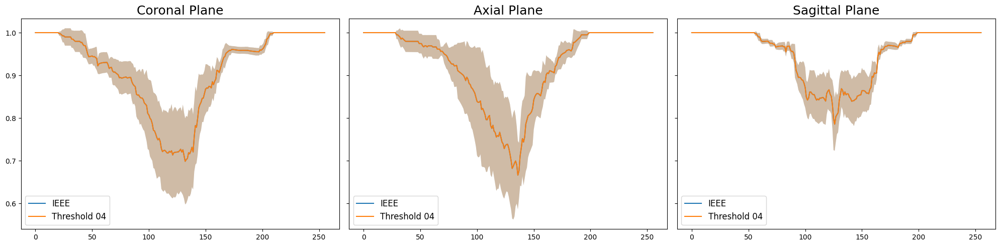

In [4]:
fig, axes = plt.subplots(1,3, figsize=(20,5), sharey=True)

for num, plane in enumerate(['coronal', 'axial', 'sagittal']):
    
    for thresh in ['04']:

        # if thresh == '1':
        tmp = []
        for i in (list(ieee_dice_slice_scores[thresh].values())):
            tmp.append(i[plane])
        avg = np.mean(tmp, axis=0)
        stdev = np.std(tmp, axis=0)
        axes[num].plot(avg, label='IEEE' )
        axes[num].fill_between(range(len(avg)), avg - stdev, avg + stdev, alpha=0.3)

        tmp = []
        for i in (list(unpool_dice_slice_scores[thresh].values())):
            tmp.append(i[plane])
        avg = np.mean(tmp, axis=0)
        stdev = np.std(tmp, axis=0)
        axes[num].plot(avg, label=f'Threshold {thresh}')
        axes[num].fill_between(range(len(avg)), avg - stdev, avg + stdev, alpha=0.3)

        # tmp = []
        # for i in (list(pool_dice_slice_scores[thresh].values())):
        #     tmp.append(i[plane])
        # avg = np.mean(tmp, axis=0)
        # stdev = np.std(tmp, axis=0)
        # axes[num].plot(avg, label=f'Pool Threshold {thresh}' )
        # axes[num].fill_between(range(len(avg)), avg - stdev, avg + stdev, alpha=0.3)

        axes[num].legend(prop={'size': 12})
        axes[num].set_title(f"{plane.title()} Plane", fontsize=18)
plt.tight_layout()


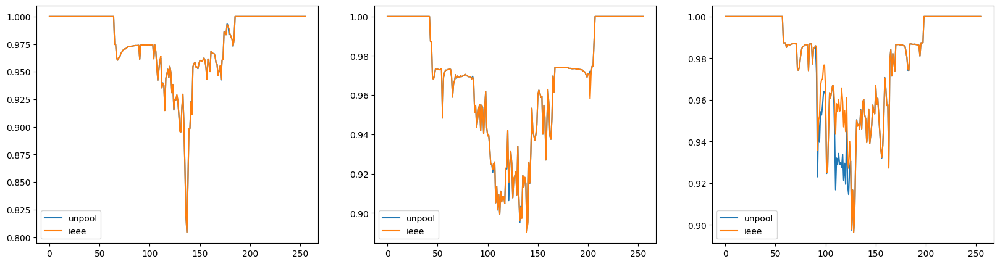

In [9]:
fig, axes = plt.subplots(1,3, figsize=(20,5))
axes[0].plot(unpool_dice_slice_scores['01'][sub]['axial'], label='unpool')
axes[0].plot(ieee_dice_slice_scores['01'][sub]['axial'], label='ieee')
axes[0].legend()

axes[1].plot(unpool_dice_slice_scores['01'][sub]['coronal'], label='unpool')
axes[1].plot(ieee_dice_slice_scores['01'][sub]['coronal'], label='ieee')
axes[1].legend()

axes[2].plot(unpool_dice_slice_scores['01'][sub]['sagittal'], label='unpool')
axes[2].plot(ieee_dice_slice_scores['01'][sub]['sagittal'], label='ieee')
axes[2].legend();

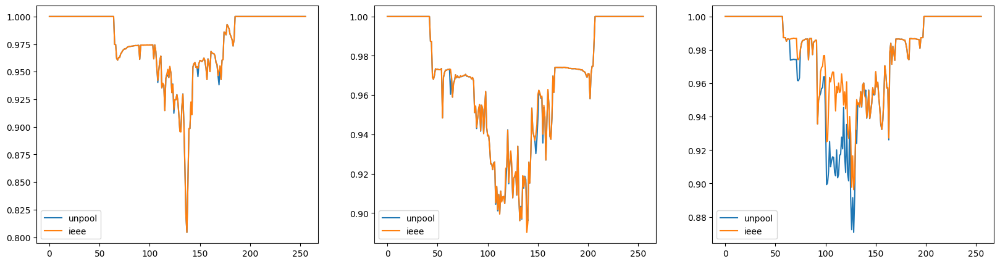

In [4]:
fig, axes = plt.subplots(1,3, figsize=(20,5))
axes[0].plot(unpool_dice_slice_scores['03'][sub]['axial'], label='unpool')
axes[0].plot(ieee_dice_slice_scores['03'][sub]['axial'], label='ieee')
axes[0].legend()

axes[1].plot(unpool_dice_slice_scores['03'][sub]['coronal'], label='unpool')
axes[1].plot(ieee_dice_slice_scores['03'][sub]['coronal'], label='ieee')
axes[1].legend()

axes[2].plot(unpool_dice_slice_scores['03'][sub]['sagittal'], label='unpool')
axes[2].plot(ieee_dice_slice_scores['03'][sub]['sagittal'], label='ieee')
axes[2].legend();

##### Visualization

In [40]:
os.chdir('/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/')

def dice_score_multiclass(pred: np.ndarray, target: np.ndarray, num_classes: int = 79, epsilon: float = 1e-6) -> np.ndarray:
    """
    Computes the Dice Score for multiple classes using NumPy.

    Args:
        pred (np.ndarray): Predicted segmentation mask of shape [H, W] with class indices.
        target (np.ndarray): Ground truth segmentation mask of shape [H, W] with class indices.
        num_classes (int): Number of segmentation classes.
        epsilon (float): Small value to avoid division by zero.

    Returns:
        np.ndarray: Dice scores for each class, shape [num_classes].
    """
    dice_scores = np.zeros(num_classes, dtype=np.float32)

    for c in range(num_classes):
        pred_c = (pred == c).astype(np.float32)  # Binary mask for class c
        target_c = (target == c).astype(np.float32)  # Binary mask for class c

        intersection = np.sum(pred_c * target_c)
        union = np.sum(pred_c) + np.sum(target_c)

        dice_scores[c] = (2.0 * intersection + epsilon) / (union + epsilon)

    return dice_scores.mean() #simple average


sag_mask = ("Left-", "ctx-rh")
combi = ["Left-", "Right-"]

lut = read_classes_from_lut("/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/FastSurferCNN/config/FastSurfer_ColorLUT.tsv")
labels, labels_sag = get_labels_from_lut(lut, sag_mask)
lateralization = unify_lateralized_labels(lut, combi)

unpool_dice_slice_scores = {}
pool_dice_slice_scores = {}
ieee_dice_slice_scores = {}

for thresh in ['1', '08', '05', '04']:
    unpool_dice_slice_scores[thresh] = {}
    pool_dice_slice_scores[thresh] = {}
    ieee_dice_slice_scores[thresh] = {}

    for sub in ['0003002', '0025011', '0025248', '0025350', '0025531']:

        aseg_path = f'/scratch/ine5/fastsurfer_embeddings/results/cpptorch/{sub}/norm/mri/aparc.DKTatlas+aseg.deep_256.mgz' if sub == '0025531' else f'/scratch/ine5/fastsurfer_embeddings/results/cpptorch/{sub}/sub-{sub}/mri/aparc.DKTatlas+aseg.mgz'
        aseg_nocc_path = f'/scratch/ine5/fastsurfer_embeddings/results/cpptorch/{sub}/norm/mri/aseg.auto_noCCseg.mgz' if sub == '0025531' else f'/scratch/ine5/fastsurfer_embeddings/results/cpptorch/{sub}/sub-{sub}/mri/aseg.auto_noCCseg.mgz'


        # Efficient loading of .mgz files
        mapped_aseg_groundtruth = np.asarray(nib.load(aseg_path, mmap=True).get_fdata(), dtype=np.int16)
        # aseg_nocc = np.asarray(nib.load(aseg_nocc_path, mmap=True).get_fdata(), dtype=np.int16)

        # print(sub)
        # mapped_aseg_groundtruth, mapped_aseg_sag_groundtruth = map_aparc_aseg2label(
        #     aseg, labels, labels_sag, lateralization, aseg_nocc, processing='aparc'
        # )

        unpool_aseg = np.asarray(nib.load(f"/scratch/ine5/fastsurfer_embeddings/results/nanunpool/{sub}/thresh{thresh}/sub-{sub}/mri/aseg.auto_noCCseg.mgz", mmap=True).get_fdata(), dtype=np.int16)    
        # unpool_aseg = np.asarray(nib.load(f"/scratch/ine5/fastsurfer_embeddings/results/nanunpool/{sub}/thresh05/sub-{sub}/mri/aparc.DKTatlas+aseg.deep.mgz", mmap=True).get_fdata(), dtype=np.int16)    
        # unpool_aseg, unpool_aseg_sag = map_aparc_aseg2label(
        #     unpool_aseg, labels, labels_sag, lateralization, unpool_aseg_nocc, processing='aparc'
        # )

        if thresh != '04' and thresh != '08': pool_aseg = np.asarray(nib.load(f"/scratch/ine5/fastsurfer_embeddings/results/cpptorch/{sub}/thresh{thresh}/sub-{sub}/mri/aseg.auto_noCCseg.mgz", mmap=True).get_fdata(), dtype=np.int16)    
        # pool_aseg = np.asarray(nib.load(f"/scratch/ine5/fastsurfer_embeddings/results/cpptorch/{sub}/thresh05/sub-{sub}/mri/aparc.DKTatlas+aseg.deep.mgz", mmap=True).get_fdata(), dtype=np.int16)    
        # pool_aseg, unpool_aseg_sag = map_aparc_aseg2label(
        #     pool_aseg, labels, labels_sag, lateralization, pool_aseg_nocc, processing='aparc'
        # )

        ieee_aseg = np.asarray(nib.load(f"/scratch/ine5/fastsurfer_embeddings/results/cpptorch/{sub}/ieee/norm.mgz/mri/aseg.auto_noCCseg.mgz", mmap=True).get_fdata(), dtype=np.int16)    
        # ieee_aseg = np.asarray(nib.load(f"/scratch/ine5/fastsurfer_embeddings/results/cpptorch/{sub}/ieee/norm.mgz/mri/aparc.DKTatlas+aseg.deep.mgz", mmap=True).get_fdata(), dtype=np.int16)    
        # ieee_aseg, ieee_aseg_sag = map_aparc_aseg2label(
        #     ieee_aseg, labels, labels_sag, lateralization, ieee_aseg_nocc, processing='aparc'
        # )

        unpool_dice_slice_scores[thresh][sub] = {'coronal': [], 'axial': [], 'sagittal': []}
        pool_dice_slice_scores[thresh][sub] = {'coronal': [], 'axial': [], 'sagittal': []}
        ieee_dice_slice_scores[thresh][sub] = {'coronal': [], 'axial': [], 'sagittal': []}

        for i in range(256):

            for plane in ['coronal', 'axial', 'sagittal']:
                if plane == 'coronal': 
                    unpool_slice = unpool_aseg[:, :, i]
                    if thresh != '04' and thresh != '08': pool_slice = pool_aseg[:, :, i]
                    ieee_slice = ieee_aseg[:, :, i]
                    groundtruth_slice = mapped_aseg_groundtruth[:, :, i]
                elif plane == 'axial': 
                    unpool_slice = unpool_aseg[:, i, :] 
                    if thresh != '04' and thresh != '08': pool_slice = pool_aseg[:, i, :] 
                    ieee_slice = ieee_aseg[:, i, :] 
                    groundtruth_slice = mapped_aseg_groundtruth[:, i, :]
                elif plane == 'sagittal': 
                    unpool_slice = unpool_aseg[i] 
                    if thresh != '04' and thresh != '08': pool_slice = pool_aseg[i] 
                    ieee_slice = ieee_aseg[i] 
                    groundtruth_slice = mapped_aseg_groundtruth[i]

                unpool_dice_slice_scores[thresh][sub][plane].append( dice_score_multiclass(unpool_slice, groundtruth_slice) )
                if thresh != '04' and thresh != '08': pool_dice_slice_scores[thresh][sub][plane].append( dice_score_multiclass(pool_slice, groundtruth_slice) )
                ieee_dice_slice_scores[thresh][sub][plane].append( dice_score_multiclass(ieee_slice, groundtruth_slice) )


pickle.dump((unpool_dice_slice_scores, pool_dice_slice_scores, ieee_dice_slice_scores), open('/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/fastsurfer_dice_per_slice.pkl','wb'))

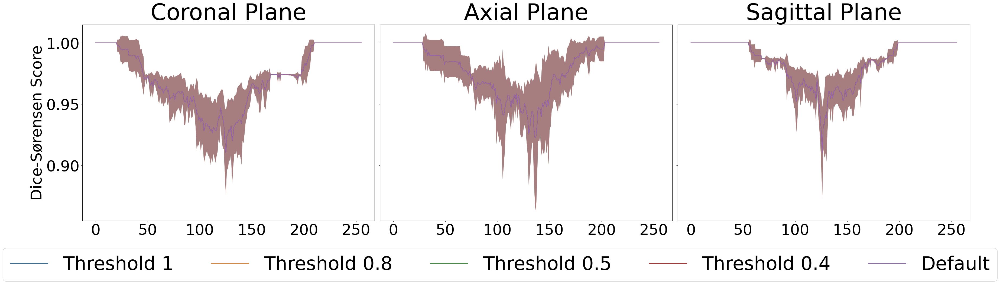

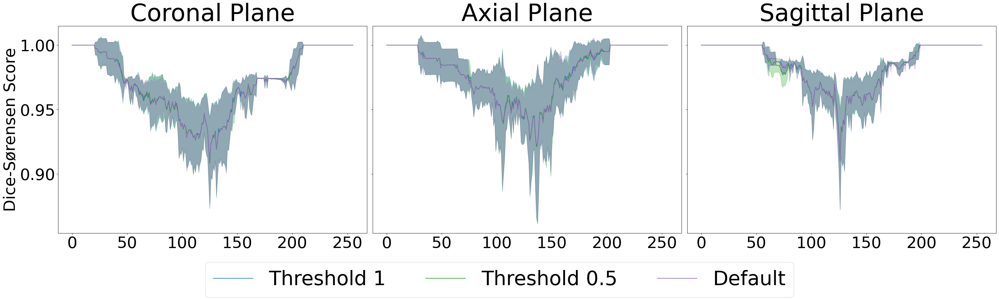

In [59]:
unpool_dice_slice_scores, pool_dice_slice_scores, ieee_dice_slice_scores = pickle.load(open('/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/fastsurfer_dice_per_slice.pkl','rb'))

fig, axes = plt.subplots(1,3, figsize=(35,9), sharey=True)

for num, plane in enumerate(['coronal', 'axial', 'sagittal']):
    
    for thresh in ['1', '08', '05', '04']:

        tmp = []
        for i in (list(unpool_dice_slice_scores[thresh].values())):
            tmp.append(i[plane])
        avg = np.mean(tmp, axis=0)
        stdev = np.std(tmp, axis=0)
        if '0' in thresh:
            thresh_name = f"0.{thresh.split('0')[-1]}"
        else: thresh_name = thresh
        axes[num].plot(avg, label=f'Threshold {thresh_name}')
        axes[num].fill_between(range(len(avg)), avg - stdev, avg + stdev, alpha=0.3)

        if thresh == '04':
            tmp = []
            for i in (list(ieee_dice_slice_scores[thresh].values())):
                tmp.append(i[plane])
            avg = np.mean(tmp, axis=0)
            stdev = np.std(tmp, axis=0)
            axes[num].plot(avg, label='Default' )
            axes[num].fill_between(range(len(avg)), avg - stdev, avg + stdev, alpha=0.3)

        axes[num].tick_params(axis='both', labelsize=40)
        axes[num].set_title(f"{plane.title()} Plane", fontsize=60)
        # axes[num].set_xlabel('Brain Slices', fontsize=40)
axes[0].set_ylabel('Dice-Sørensen Score', fontsize=40)
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, prop={'size': 50}, loc='lower center', bbox_to_anchor=(0.5, -0.2), ncol=5)
plt.tight_layout()
plt.savefig('/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/figures/fastsurfer_dice_2d_nanunpool.pdf', format="pdf", bbox_inches="tight")

fig, axes = plt.subplots(1,3, figsize=(35,9), sharey=True)
for num, plane in enumerate(['coronal', 'axial', 'sagittal']):
    
    for thresh in ['1', '05',]:

        tmp = []
        for i in (list(pool_dice_slice_scores[thresh].values())):
            tmp.append(i[plane])
        avg = np.mean(tmp, axis=0)
        stdev = np.std(tmp, axis=0)
        if '0' in thresh:
            thresh_name = f"0.{thresh.split('0')[-1]}"
            color = 'tab:green'
        else: 
            thresh_name = thresh
            color='tab:blue'
        axes[num].plot(avg, label=f'Threshold {thresh_name}', color=color )
        axes[num].fill_between(range(len(avg)), avg - stdev, avg + stdev, alpha=0.3, color=color)
        # axes[num].set_xlabel('Brain Slices', fontsize=40)
        axes[num].tick_params(axis='both', labelsize=40)
        axes[num].set_title(f"{plane.title()} Plane", fontsize=60)

        if thresh == '05':
            tmp = []
            for i in (list(ieee_dice_slice_scores[thresh].values())):
                tmp.append(i[plane])
            avg = np.mean(tmp, axis=0)
            stdev = np.std(tmp, axis=0)
            axes[num].plot(avg, label='Default', color='tab:purple')
            axes[num].fill_between(range(len(avg)), avg - stdev, avg + stdev, alpha=0.3, color='tab:purple')


# axes[1].legend(prop={'size': 30}, loc='lower center', bbox_to_anchor=(0.2, -0.3), ncol=3)
axes[0].set_ylabel('Dice-Sørensen Score', fontsize=40)
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, prop={'size': 50}, loc='lower center', bbox_to_anchor=(0.5, -0.2), ncol=3)
plt.tight_layout()
plt.savefig('/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/figures/fastsurfer_dice_2d_nanpool.pdf', format="pdf", bbox_inches="tight")

In [24]:
pred_mask = np.random.randint(0, 2, (256, 256))  # Random binary mask
target_mask = np.random.randint(0, 2, (256, 256))  # Another random binary mask

# sns.heatmap(unpool_slice)
pred_mask.shape , groundtruth_slice.shape

((256, 256), (256, 256))

### Dice Loss
* Presence of NaNs is throwing off calculation of Dice loss
* Replacing NaNs with all 0s, all 1s, and mixture of both have no effect leading me to conclude issue may not solely be with softmax operation

In [ ]:
def calculate_loss_unpool(thresholds, subject_list, file_dir):
    os.chdir('/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/')

    # Load static resources only once
    from FastSurferCNN.data_loader.data_utils import get_labels_from_lut, unify_lateralized_labels, read_classes_from_lut, map_aparc_aseg2label
    from FastSurferCNN.models.losses import CombinedLoss

    sag_mask = ("Left-", "ctx-rh")
    combi = ["Left-", "Right-"]

    lut = read_classes_from_lut("/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/FastSurferCNN/config/FastSurfer_ColorLUT.tsv")
    labels, labels_sag = get_labels_from_lut(lut, sag_mask)
    lateralization = unify_lateralized_labels(lut, combi)

    fs_thresh = {}
    fs_ieee = {}

    # Preload classifiers in memory
    classifiers_cache = {}

    def process_subject(sub):

        # aseg_path = f'{file_dir}/{sub}/thresh05/sub-{sub}/mri/aparc.DKTatlas+aseg.deep.mgz' 
        # aseg_nocc_path = f'{file_dir}/{sub}/thresh05/sub-{sub}/mri/aseg.auto_noCCseg.mgz' 
        aseg_path = f'/scratch/ine5/fastsurfer_embeddings/results/cpptorch/{sub}/norm/mri/aparc.DKTatlas+aseg.deep_256.mgz' if sub == '0025531' else f'/scratch/ine5/fastsurfer_embeddings/results/cpptorch/{sub}/sub-{sub}/mri/aparc.DKTatlas+aseg.mgz'
        aseg_nocc_path = f'/scratch/ine5/fastsurfer_embeddings/results/cpptorch/{sub}/norm/mri/aseg.auto_noCCseg.mgz' if sub == '0025531' else f'/scratch/ine5/fastsurfer_embeddings/results/cpptorch/{sub}/sub-{sub}/mri/aseg.auto_noCCseg.mgz'


        # Efficient loading of .mgz files
        aseg = np.asarray(nib.load(aseg_path, mmap=True).get_fdata(), dtype=np.int16)
        aseg_nocc = np.asarray(nib.load(aseg_nocc_path, mmap=True).get_fdata(), dtype=np.int16)

        print(sub)
        mapped_aseg, mapped_aseg_sag = map_aparc_aseg2label(
            aseg, labels, labels_sag, lateralization, aseg_nocc, processing='aparc'
        )

        loss = CombinedLoss()
        fs_thresh[sub] = {}
        fs_ieee[sub] = {'coronal': np.zeros((256, 3)), 'axial': np.zeros((256, 3)), 'sagittal': np.zeros((256, 3))}

        for thresh in thresholds:
            fs_thresh[sub][thresh] = {'coronal': np.zeros((256, 3)), 'axial': np.zeros((256, 3)), 'sagittal': np.zeros((256, 3))}

            # for plane in ['coronal', 'sagittal', 'axial', ]:
            for plane in ['axial', ]:
                for i in range(100,105):
                    print(thresh, i, plane)
                    # Preload classifiers if not cached
                    key_thresh = (sub, plane, thresh, i)
                    key_ieee = (sub, plane, i)
                    print('key_thresh', key_thresh)
                    print('key_ieee', key_ieee)

                    if key_thresh not in classifiers_cache:
                        try:
                            # classifiers_cache[key_thresh] = pickle.load(open(f"{file_dir}/{sub}/{plane}/thresh{''.join(thresh.split('.'))}/1_classifier_{i}.pkl", 'rb'))
                            # classifiers_cache[key_thresh] = pickle.load(open(f"/scratch/ine5/fastsurfer_embeddings/results/cpptorch/{sub}/{plane}/thresh{thresh}/1_classifier_{i}.pkl", 'rb'))

                            # Create a mask for NaNs
                            tensor = pickle.load(open(f"{file_dir}/{sub}/thresh{thresh}/{plane}/1_classifier_{i}.pkl", 'rb'))
                            nan_mask = torch.isnan(tensor)
                            # Set NaNs in channel 1 to 1, and others to 0
                            tensor = torch.where(nan_mask & (torch.arange(79)[None, :, None, None] == 0), 1, tensor)
                            tensor = torch.where(nan_mask & (torch.arange(79)[None, :, None, None] != 0), 0, tensor)

                            classifiers_cache[key_thresh] = tensor

                            # classifiers_cache[key_thresh] = torch.nan_to_num(pickle.load(open(f"{file_dir}/{sub}/thresh1/{plane}/1_classifier_{i}.pkl", 'rb')), nan=1/79)
                            print(f"{file_dir}/{sub}/thresh1/{plane}/1_classifier_{i}.pkl", 'rb')
                        except FileNotFoundError:
                            # print(f"{file_dir}/{sub}/{plane}/thresh{''.join(thresh.split('.'))}/1_classifier_{i}.pkl")
                            print(f"{file_dir}/{sub}/{plane}/1_classifier_{i}.pkl")
                            classifiers_cache[key_thresh] = None
                    classifier_thresh1 = classifiers_cache[key_thresh]

                    if key_ieee not in classifiers_cache:
                        try:
                            classifiers_cache[key_ieee] = pickle.load(open(f"/scratch/ine5/fastsurfer_embeddings/results/cpptorch/{sub}/ieee/{plane}/ieee_classifier_{i}.pkl", 'rb'))
                            print(f"/scratch/ine5/fastsurfer_embeddings/results/cpptorch/{sub}/ieee/{plane}/ieee_classifier_{i}.pkl")
                        except FileNotFoundError:
                            print(f"/scratch/ine5/fastsurfer_embeddings/results/cpptorch/{sub}/ieee/{plane}/ieee_classifier_{i}.pkl")
                            classifiers_cache[key_ieee] = None
                    classifier_ieee = classifiers_cache.get(key_ieee)

                    # Tensor operations
                    aseg_slice = {
                        'coronal': torch.tensor(mapped_aseg[:, :, i]).unsqueeze(0),
                        'axial': torch.tensor(mapped_aseg[:, i, :]).T.unsqueeze(0),
                        'sagittal': torch.tensor(mapped_aseg_sag[i].T).unsqueeze(0)
                    }[plane]

                    # Loss calculations
                    if classifier_thresh1 is not None:
                        tmp = list(loss(classifier_thresh1, aseg_slice, weight=1))
                        print(tmp)
                        fs_thresh[sub][thresh][plane][i, :] = tmp
                    if classifier_ieee is not None:
                        print('ieee', list(loss(classifier_ieee, aseg_slice, weight=1)))
                        fs_ieee[sub][plane][i, :] = list(loss(classifier_ieee, aseg_slice, weight=1))

        return fs_thresh[sub], fs_ieee[sub]
    
    # Sequential processing of subjects
    for sub in subject_list:
        print(sub)
        thresh_result, ieee_result = process_subject(sub)
        fs_thresh[sub] = thresh_result
        fs_ieee[sub] = ieee_result

    return fs_thresh, fs_ieee



fs_thresh, fs_ieee = calculate_loss_unpool(thresholds=['1'], subject_list=['0025531'], file_dir='/scratch/ine5/fastsurfer_embeddings/results/nanunpool/')


here
0025531
0025531
Initialized CrossEntropy2D with weight: None and reduction: none
1 100 axial
key_thresh ('0025531', 'axial', '1', 100)
key_ieee ('0025531', 'axial', 100)
/scratch/ine5/fastsurfer_embeddings/results/nanunpool//0025531/thresh1/axial/1_classifier_100.pkl rb
/scratch/ine5/fastsurfer_embeddings/results/cpptorch/0025531/ieee/axial/ieee_classifier_100.pkl
[tensor(2.7578), tensor(0.7884), tensor(1.9695)]
ieee [tensor(0.4987), tensor(0.4682), tensor(0.0305)]
1 101 axial
key_thresh ('0025531', 'axial', '1', 101)
key_ieee ('0025531', 'axial', 101)
/scratch/ine5/fastsurfer_embeddings/results/nanunpool//0025531/thresh1/axial/1_classifier_101.pkl rb
/scratch/ine5/fastsurfer_embeddings/results/cpptorch/0025531/ieee/axial/ieee_classifier_101.pkl
[tensor(2.7630), tensor(0.7928), tensor(1.9702)]
ieee [tensor(0.5019), tensor(0.4725), tensor(0.0295)]
1 102 axial
key_thresh ('0025531', 'axial', '1', 102)
key_ieee ('0025531', 'axial', 102)
/scratch/ine5/fastsurfer_embeddings/results/nan

In [2]:
fs_thresh, fs_ieee = pickle.load(open(f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/unpool_fs_loss.pkl', 'rb'))

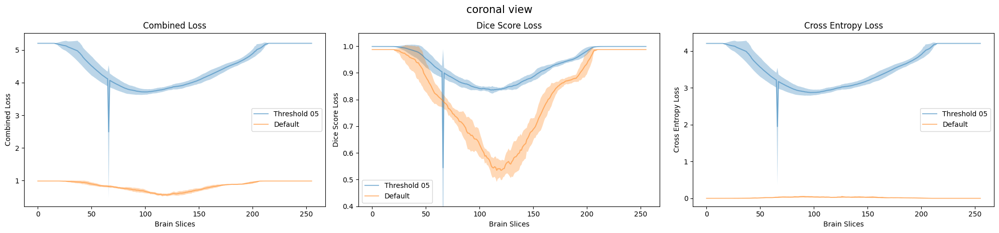

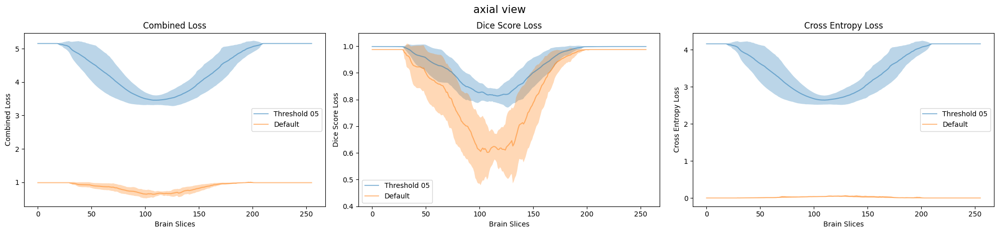

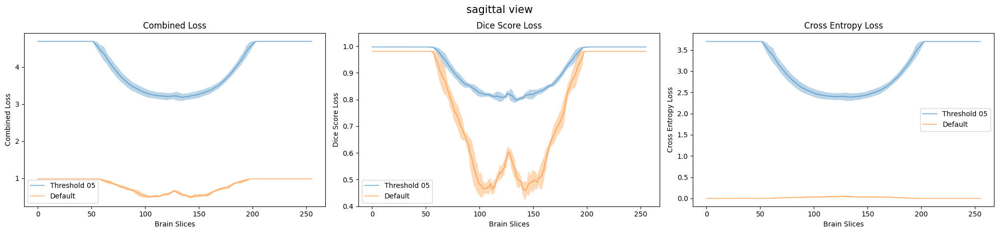

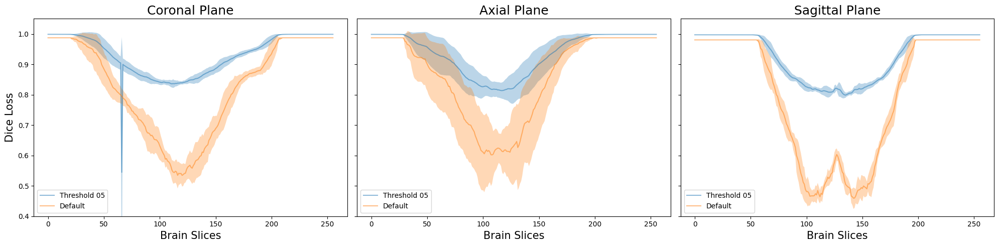

In [60]:
# Initialize a dictionary to store the averages
average_data_ieee = {}
average_data_thresh = {}

average_data_ieee = {}
for plane in ['coronal', 'axial', 'sagittal']:

    average_data_ieee[plane] = {'avg': [], 'std': []}

    # Collect data from all subjects for the current threshold and plane
    plane_data_ieee = [fs_ieee_5subs[sub][plane] for sub in ['0025531', '0003002', '0025011', '0025248', '0025350']]
    # plane_data_ieee = [fs_ieee[sub][plane] for sub in ['0025531' ] ]
    # plane_data_ieee = [fs_ieee[sub][plane] for sub in ['0025362', '0025406', '0025436', '0025462', '0025507'] ]
    
    # Convert to a NumPy array for easier averaging
    plane_data_np_ieee = np.array(plane_data_ieee)
    
    # Calculate the average across subjects
    avg_values_ieee = np.mean(plane_data_np_ieee, axis=0)
    std_values_ieee = np.std(plane_data_np_ieee, axis=0)
    
    # Store the average in the result dictionary
    average_data_ieee[plane]['avg'] = avg_values_ieee.tolist()
    average_data_ieee[plane]['std'] = std_values_ieee.tolist()


for thresh in ['05', ]:
    average_data_thresh[thresh] = {}
    for plane in ['coronal', 'axial', 'sagittal']:

        average_data_thresh[thresh][plane] = {'avg': [], 'std': []}

        # Collect data from all subjects for the current threshold and plane
        plane_data_thresh = [fs_thresh[sub][thresh][plane] for sub in ['0025531', '0003002', '0025011', '0025248', '0025350'] ]
        # plane_data_thresh = [fs_thresh[sub][thresh][plane] for sub in ['0025531', ] ]
        # plane_data_thresh = [fs_thresh[sub][thresh][plane] for sub in ['0025362', '0025406', '0025436', '0025462', '0025507'] ]
        
        # Convert to a NumPy array for easier averaging
        plane_data_np_thresh = np.array(plane_data_thresh)
        
        # Calculate the average across subjects
        avg_values_thresh = np.mean(plane_data_np_thresh, axis=0)
        std_values_thresh = np.std(plane_data_np_thresh, axis=0)
        
        # Store the average in the result dictionary
        average_data_thresh[thresh][plane]['avg'] = avg_values_thresh.tolist()
        average_data_thresh[thresh][plane]['std'] = std_values_thresh.tolist()


# Assuming `average_data_ieee` and `average_data_thresh` are already defined and populated as dictionaries with average and std data

# Initialize a dictionary to store the averages
combo_ieee = {}
dice_ieee = {}
ce_ieee = {}

for plane, vals in average_data_ieee.items():
    combo_ieee[plane] = {'avg': np.array(vals['avg'])[:, 0], 'std': np.array(vals['std'])[:, 0]}
    dice_ieee[plane] = {'avg': np.array(vals['avg'])[:, 1], 'std': np.array(vals['std'])[:, 1]}
    ce_ieee[plane] = {'avg': np.array(vals['avg'])[:, 2], 'std': np.array(vals['std'])[:, 2]}

# Initialize dictionaries for threshold data
combo_thresh = {}
dice_thresh = {}
ce_thresh = {}

for thresh, planes_data in average_data_thresh.items():
    combo_thresh[thresh] = {plane: {'avg': np.array(vals['avg'])[:, 0], 'std': np.array(vals['std'])[:, 0]} for plane, vals in planes_data.items()}
    dice_thresh[thresh] = {plane: {'avg': np.array(vals['avg'])[:, 1], 'std': np.array(vals['std'])[:, 1]} for plane, vals in planes_data.items()}
    ce_thresh[thresh] = {plane: {'avg': np.array(vals['avg'])[:, 2], 'std': np.array(vals['std'])[:, 2]} for plane, vals in planes_data.items()}

# Plotting
for plane in ['coronal', 'axial', 'sagittal' ]:
    fig, axes = plt.subplots(1, 3, figsize=(20, 5))


    for thresh in ['05', ]:

        # Combined Loss
        axes[0].plot(combo_thresh[thresh][plane]['avg'], label=f'Threshold {thresh}', alpha=0.5)
        axes[0].fill_between(range(len(combo_thresh[thresh][plane]['avg'])), 
                            combo_thresh[thresh][plane]['avg'] - combo_thresh[thresh][plane]['std'], 
                            combo_thresh[thresh][plane]['avg'] + combo_thresh[thresh][plane]['std'], 
                            alpha=0.3)
        
        axes[0].set_title(f"Combined Loss")
        axes[0].set_xlabel('Brain Slices')
        axes[0].set_ylabel('Combined Loss')

        # Dice Score Loss
        axes[1].plot(dice_thresh[thresh][plane]['avg'], label=f'Threshold {thresh}', alpha=0.5)
        axes[1].fill_between(range(len(dice_thresh[thresh][plane]['avg'])), 
                            dice_thresh[thresh][plane]['avg'] - dice_thresh[thresh][plane]['std'], 
                            dice_thresh[thresh][plane]['avg'] + dice_thresh[thresh][plane]['std'], 
                            alpha=0.3)
        
        axes[1].set_title(f"Dice Score Loss")
        axes[1].set_xlabel('Brain Slices')
        axes[1].set_ylabel('Dice Score Loss')
        axes[1].set_ylim(0.4, 1.05)


        # Cross Entropy Loss
        axes[2].plot(ce_thresh[thresh][plane]['avg'], label=f'Threshold {thresh}', alpha=0.5)
        axes[2].fill_between(range(len(ce_thresh[thresh][plane]['avg'])), 
                            ce_thresh[thresh][plane]['avg'] - ce_thresh[thresh][plane]['std'], 
                            ce_thresh[thresh][plane]['avg'] + ce_thresh[thresh][plane]['std'], 
                            alpha=0.3)
                
        axes[2].set_title(f"Cross Entropy Loss")
        axes[2].set_xlabel('Brain Slices')
        axes[2].set_ylabel('Cross Entropy Loss')

    
    #Plot default
    axes[0].plot(combo_ieee[plane]['avg'], label='Default', alpha=0.5)
    axes[0].fill_between(range(len(combo_ieee[plane]['avg'])), 
                        combo_ieee[plane]['avg'] - combo_ieee[plane]['std'], 
                        combo_ieee[plane]['avg'] + combo_ieee[plane]['std'], 
                        alpha=0.3)
    axes[0].legend()

    axes[1].plot(dice_ieee[plane]['avg'], label='Default', alpha=0.5)
    axes[1].fill_between(range(len(dice_ieee[plane]['avg'])), 
                        dice_ieee[plane]['avg'] - dice_ieee[plane]['std'], 
                        dice_ieee[plane]['avg'] + dice_ieee[plane]['std'], 
                        alpha=0.3)
    axes[1].legend()

    axes[2].plot(ce_ieee[plane]['avg'], label='Default', alpha=0.5)
    axes[2].fill_between(range(len(ce_ieee[plane]['avg'])), 
                        ce_ieee[plane]['avg'] - ce_ieee[plane]['std'], 
                        ce_ieee[plane]['avg'] + ce_ieee[plane]['std'], 
                        alpha=0.3)
    axes[2].legend()
    # axes[2].set_title(f"Cross Entropy Loss\nDefault Mean: {np.mean(ce_ieee[plane]['avg']):.2f} NaN Mean: {np.mean(ce_thresh['avg']):.2f}"), axes[2].legend()

    fig.suptitle(f"{plane} view\n", fontsize=15, y=0.92)


    plt.tight_layout()
    plt.show()


# Plotting Just Dice Loss

fig, axes = plt.subplots(1, 3, figsize=(20, 5), sharey=True)

for num, plane in enumerate(['coronal', 'axial', 'sagittal' ]):
    for thresh in ['05', ]:

        # Dice Score Loss
        axes[num].plot(dice_thresh[thresh][plane]['avg'], label=f'Threshold {thresh}', alpha=0.5)
        fill_between_poly = axes[num].fill_between(range(len(dice_thresh[thresh][plane]['avg'])), 
                            dice_thresh[thresh][plane]['avg'] - dice_thresh[thresh][plane]['std'], 
                            dice_thresh[thresh][plane]['avg'] + dice_thresh[thresh][plane]['std'], 
                            alpha=0.3)

        # Apply hatching to the filled region
        # for poly in fill_between_poly.get_paths():
        #     patch = plt.Polygon(poly.vertices, closed=True, fill=False, hatch='//', edgecolor='lightblue')
        #     axes[num].add_patch(patch)
        
        axes[num].set_title(f"{plane.title()} Plane", fontsize=18)
        axes[num].set_xlabel('Brain Slices', fontsize=15)
        axes[num].set_ylim(0.4, 1.05)


    #Plot default
    axes[num].plot(dice_ieee[plane]['avg'], label='Default', alpha=0.5)
    axes[num].fill_between(range(len(dice_ieee[plane]['avg'])), 
                        dice_ieee[plane]['avg'] - dice_ieee[plane]['std'], 
                        dice_ieee[plane]['avg'] + dice_ieee[plane]['std'], 
                        alpha=0.3)
    
    axes[num].legend()

axes[0].set_ylabel('Dice Loss', fontsize=15)

plt.tight_layout()
# plt.savefig("dice_loss.pdf", format="pdf", bbox_inches="tight")
plt.show()


### Segmentation Differences

In [33]:
filedir = '/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/unpool/dice_pool_vs_unpool'
subjects = ['0025531', '0025011', '0003002', '0025248', '0025350'] 
thresh_df = {}

for thresh in ['05', '1']:
    row_names = []
    aggregated_data = {}
    for sub in subjects:
        # for mode in ['unpool', 'pool', "ieee"]:
        for mode in ['unpool', ]:
            row_names.append(f"{sub} {mode}")
            if mode == 'ieee':
                unpool_dice = json.load(open(f"{filedir}/{sub}_{mode}.json"))
            else:
                unpool_dice = json.load(open(f"{filedir}/{sub}_{mode}_thresh{thresh}.json"))
            labels = unpool_dice['measures']['dice']['labels']
            # if labels:
            for label, dice_scores in labels.items():
                if label in ['30', '62', '85']: continue
                # If the label is not already in the aggregated_data, initialize it as an empty list
                if label not in aggregated_data:
                    aggregated_data[label] = []
                # Append the value to the list for this label
                aggregated_data[label].append(dice_scores)


    df = pd.DataFrame(aggregated_data, index=row_names)
    df = df.rename(columns=unpool_dice['names'])
    thresh_df[thresh] = df.T

df

,Left-Thalamus,Left-Caudate,Left-Putamen,Left-Pallidum,3rd-Ventricle,4th-Ventricle,Brain-Stem,Left-Hippocampus,Left-Amygdala,Left-Cerebral-White-Matter,...,Right-Putamen,Right-Pallidum,Right-Hippocampus,Right-Amygdala,Right-Accumbens-area,Right-VentralDC,Right-choroid-plexus,Left-Cerebellum-White-Matter,WM-hypointensities,Left-Cerebellum-Cortex
0025531 unpool,0.998362,0.998170,0.998161,0.996244,0.997340,0.983651,0.994926,0.995557,0.994533,0.996865,...,0.998396,0.998067,0.995276,0.993513,0.999145,0.995624,0.992378,0.957295,0.990073,0.975570
0025011 unpool,0.959016,0.949556,0.946923,0.914937,0.918468,0.922462,0.939788,0.909759,0.875392,0.932124,...,0.945876,0.858970,0.914091,0.880987,0.882642,0.890311,0.691120,0.871136,0.617764,0.869189
0003002 unpool,0.936791,0.946082,0.940633,0.918682,0.925532,0.915924,0.943221,0.932847,0.911954,0.944411,...,0.932274,0.885646,0.929223,0.917576,0.908567,0.900328,0.598397,0.901411,0.624896,0.941568
0025248 unpool,0.941826,0.912148,0.931721,0.866292,0.853846,0.909250,0.958833,0.919416,0.855290,0.914176,...,0.921275,0.827960,0.931868,0.903814,0.838314,0.914020,0.623053,0.876213,0.563303,0.933803
0025350 unpool,0.941234,0.949330,0.953972,0.908869,0.897314,0.936788,0.950637,0.902658,0.898616,0.951347,...,0.947653,0.899060,0.913039,0.886784,0.851767,0.920795,0.778626,0.926007,0.591316,0.936951


**Determine worst performing subjects for NaN Unpooling & Pooling**

In [34]:
# NAN UNPOOLING
for thresh in thresh_df:
    df_T_sorted = thresh_df[thresh][thresh_df[thresh].mean(axis=0).sort_values(ascending=False).index]
    print(thresh)
    print(df_T_sorted.mean())

05
0025531 unpool    0.992144
0025248 unpool    0.986978
0025350 unpool    0.894333
0003002 unpool    0.885859
0025011 unpool    0.882120
dtype: float64
1
0025531 unpool    0.992144
0025350 unpool    0.894333
0003002 unpool    0.885859
0025011 unpool    0.882120
0025248 unpool    0.866908
dtype: float64


In [32]:
# NAN POOLING
for thresh in thresh_df:
    df_T_sorted = thresh_df[thresh][thresh_df[thresh].mean(axis=0).sort_values(ascending=False).index]
    print(thresh)
    print(df_T_sorted.mean())

05
0025248 pool    1.000000
0025531 pool    0.996112
0025350 pool    0.893795
0003002 pool    0.885940
0025011 pool    0.877856
dtype: float64
1
0025531 pool    1.000000
0025350 pool    0.893628
0003002 pool    0.885518
0025011 pool    0.877089
0025248 pool    0.870280
dtype: float64


**Make Nifti Image where differences between NaN image and reference is marked by a bright red voxel (figure shown in paper)**

In [36]:
def diff_images(img1_path, img2_path):
    # Load images
    img1 = nib.load(img1_path)
    img2 = nib.load(img2_path)
    
    # Get data arrays
    data1 = img1.get_fdata()
    data2 = img2.get_fdata()
    
    # Compute differences
    differences = data1 - data2
    
    # Create a mask to identify non-matching voxels
    mask = (data1 != data2)
    
    # Apply mask to set non-matching voxels to NaN
    #125 == 173,255,47,0 = neon green
    #150 == bright red
    differences[mask] = 150
    
    # Create a new NIfTI image with NaNs where differences occurred
    diff_img = nib.Nifti1Image(differences, img1.affine, img1.header)
    
    return diff_img


for thresh in ['1', '05']:
    # for sub in ['0025531', '0003002', '0025011', '0025248', '0025350']:
    if thresh == '05': sub = '0025011'
    elif thresh == '1': sub = '0025248'
    # diff_img = diff_images( f'../../results/cpptorch/{sub}/ieee/norm.mgz/mri/aseg.auto_noCCseg.mgz', f'../../results/cpptorch/{sub}/norm.mgz/mri/aseg.auto_noCCseg_thresh{thresh}.mgz')
    diff_img = diff_images( f'../../results/cpptorch/{sub}/ieee/norm.mgz/mri/aseg.auto_noCCseg.mgz', f'../../results/nanunpool/{sub}/thresh{thresh}/sub-{sub}/mri/aseg.auto_noCCseg.mgz')
    nib.save(diff_img, f'/scratch/ine5/fastsurfer_embeddings/fastsurfer-embeddings/embedding_project/figures/unpool_{sub}_diffseg_thresh{thresh}.mgz')
